# Sentiment Analysis of Earnings Call Transcripts: How Do CEOs and CFOs Modify Their Sentiment in Times of Economic Crisis?

### by Mathieu Breier, Edward Monbiot, Amber Walker
#### March 18th 2024
---------------



<a id='top'></a>
## Table of Contents

1. [Earning Call Transcripts Preprocessing](#section1)
    - [Preprocessing Pipeline](#section1a)
2. [TF-IDF WordCloud](#section2)
    - [Aggregated Word Cloud Accross All Companies](#section2a)
3. [Sentiment Analysis](#section3)
    - [Loughran McDonald Sentiment Analyzer Pipeline](#section3a)
    - [Apply Pipeline to RCL](#section3b)
    - [Apply Pipeline to NCLH](#section3c)
    - [Apply Pipeline to DAL](#section3d)
    - [Apply Pipeline to LUV](#section3e)
4. [CEO & CFO Sentiment Graphs](#section4)
    - [Define COVID Timelines](#section4a)
    - [CEO and CFO Sentiment Scores Plots](#section4b)
    - [Add Financial Data to the Plots](#section4c)
    - [Combining the Graphs](#section4d)
    - [Final Visualisations with Volume Traded](#section4e)
5. [Regression Analysis](#section5)
    - [Linear Regression](#section5a)
    - [Regression Including Lags](#section5b)

---------

Importing Libraries

In [2983]:
import json
import pandas as pd
import seaborn as sns
from selenium.webdriver.common.by import By
from selenium.common.exceptions import NoSuchElementException, ElementClickInterceptedException, StaleElementReferenceException, TimeoutException
from selenium import webdriver
import os
from bs4 import BeautifulSoup
import time
from selenium.webdriver.firefox.service import Service
from selenium.webdriver.firefox.options import Options
import requests
from selenium.webdriver.support.ui import WebDriverWait
from selenium.webdriver.support import expected_conditions as EC
import re
from datetime import datetime
import locale
import numpy as np
from concurrent.futures import ThreadPoolExecutor
from lxml import html
import matplotlib.pyplot as plt
from wordcloud import WordCloud
import nltk
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer
from sklearn.feature_extraction.text import TfidfVectorizer

# warnings
import warnings
warnings.filterwarnings("ignore")

In [2984]:
# Bse color
bse = (57/255, 129/255, 153/255)
bse_color = '#{0:02x}{1:02x}{2:02x}'.format(int(bse[0] * 255), int(bse[1] * 255), int(bse[2] * 255))

# Ceo color
ceo = (30, 65, 116)
ceo = '#{0:02x}{1:02x}{2:02x}'.format(ceo[0], ceo[1], ceo[2])

# CfO color
cfo = (221, 169, 75)
cfo = '#{0:02x}{1:02x}{2:02x}'.format(cfo[0], cfo[1], cfo[2])

# share prices
prices = (8, 78, 0)
prices = '#{0:02x}{1:02x}{2:02x}'.format(prices[0], prices[1], prices[2])

# volumes prices
volumes = (0, 78, 77)
volumes = '#{0:02x}{1:02x}{2:02x}'.format(volumes[0], volumes[1], volumes[2])


<a id='section1'></a>
## 1) Earning Call Transcripts Preprocessing
---------------


[Return to Top](#top)

We base our analysis on 4 different companies: 
+ Royal Caribbean Cruises Line (RCL) - represented in Orange
+ Norwegian Cruise Line (NCLH) - represented in Black
+ Delta Air Lines (DAL) - represented in Dark Red
+ Southwest Airlines (LUV) - represented in Dark Blue

These companies represent the largest companies in the cruise and airline sector. We specifically decide to analyse these 2 sectors as they were the most impacted by the Covid-19 crisis and more precisely by the lockdown measures that followed the pandemic. 

In [2985]:
### Reading csv file
# ED PATHS
# path = "/Users/edwardkohn/Desktop/Advanced_NLP/Project/"

# MATHIEU FILE PATHS
path = "/Users/mathieu26/Desktop/DSDM-BSE/Term_2/Text_Mining_and_Natural_Lan_Processing/Final_Project/"

# AMBER FILE PATHS
#path = "/Users/amberwalker/advanced_nlp_project/"
df_rcl = pd.read_csv(path + 'royal_caribbean_cruises.csv')
df_nclh = pd.read_csv(path + 'norwegian_cruise_line.csv')
df_dal = pd.read_csv(path +'delta_air_lines_.csv')
df_luv = pd.read_csv(path + 'southwest_airlines.csv')


<a id='section1a'></a>
### Preprocessing Pipeline

In [2986]:
class TextAnalyzer:
    def __init__(self, dataframe):
        self.df = dataframe
        nltk.download('stopwords')

    @staticmethod
    def remove_html_tags(text):
        pattern = re.compile('<.*?>')
        return pattern.sub('', text)

    @staticmethod
    def preprocess_text(text):
        # Lowercasing
        text = text.lower()
        # Remove HTML tags
        text = TextAnalyzer.remove_html_tags(text)
        # Remove special characters and punctuation
        text = re.sub(r'[^\w\s]+', '', text)
        # Remove numbers
        #text = re.sub(r'\d+', '', text)
        # Remove stopwords
        stop_words = set(stopwords.words('english'))
        text = ' '.join([word for word in text.split() if word not in stop_words])
        #Stemming (optional, uncomment if needed)
        stemmer = PorterStemmer()
        text = ' '.join([stemmer.stem(word) for word in text.split()])
        # Remove extra spaces
        text = text.strip().replace(r'\s+', ' ')
        return text

    def apply_preprocessing(self):
        self.df['CEO Text Cleaned'] = self.df['CEO Text'].apply(self.preprocess_text)
        self.df['CFO Text Cleaned'] = self.df['CFO Text'].apply(self.preprocess_text)

Preprocessing RCL

In [2987]:
text_analyzer = TextAnalyzer(df_rcl)
text_analyzer.apply_preprocessing()

# Rename the DataFrame to df_preprocessed
df_preprocessed_rcl = text_analyzer.df

# Now, df_preprocessed will have additional columns for preprocessed CEO and CFO texts
df_preprocessed_rcl.head(5)


[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/mathieu26/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


,Title,Date,CEO Text,CFO Text,Link,CEO Text Cleaned,CFO Text Cleaned
0,Royal Caribbean Cruises (RCL) Q4 2023 Earnings...,"Feb 01, 2024","Thank you, Michael, and good morning, everyone...","Thank you, Jason, and good morning everyone. L...",https://www.fool.com/earnings/call-transcripts...,thank michael good morn everyon get detail wou...,thank jason good morn everyon let start review...
1,Royal Caribbean Cruises (RCL) Q3 2023 Earnings...,"Oct 26, 2023","Thank you, Michael, and good morning, everyone...","Thank you, Jason, and good morning, everyone. ...",https://www.fool.com/earnings/call-transcripts...,thank michael good morn everyon begin today wo...,thank jason good morn everyon let start thirdq...
2,Royal Caribbean Cruises (RCL) Q2 2023 Earnings...,"Jul 27, 2023","Thank you, Michael, and good morning, everyone...","Thank you, Jason, and good morning, everyone. ...",https://www.fool.com/earnings/call-transcripts...,thank michael good morn everyon im thrill shar...,thank jason good morn everyon begin discuss re...
3,Royal Caribbean Cruises (RCL) Q1 2023 Earnings...,"May 04, 2023","Thank you, Michael, and good morning, everyone...","Thank you, Jason, and good morning, everyone. ...",https://www.fool.com/earnings/call-transcripts...,thank michael good morn everyon im thrill morn...,thank jason good morn everyon let begin discus...
4,Royal Caribbean Cruises (RCL) Q4 2022 Earnings...,"Feb 07, 2023","Thank you, Michael, and good morning, everyone...","Thank you, Jason, and good morning, everyone. ...",https://www.fool.com/earnings/call-transcripts...,thank michael good morn everyon get start beha...,thank jason good morn everyon let begin discus...


Preprocessing NCLH

In [2988]:
text_analyzer = TextAnalyzer(df_nclh)
text_analyzer.apply_preprocessing()

# Rename the DataFrame to df_preprocessed
df_preprocessed_nclh = text_analyzer.df

# Now, df_preprocessed will have additional columns for preprocessed CEO and CFO texts
df_preprocessed_nclh.head(5)

[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/mathieu26/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


,Title,Date,CEO Text,CFO Text,Link,CEO Text Cleaned,CFO Text Cleaned
0,Norwegian Cruise Line (NCLH) Q4 2023 Earnings ...,"Feb 27, 2024","Well, thank you, Sarah, and good morning, ever...","Thank you, Harry, and good morning, everyone. ...",https://www.fool.com/earnings/call-transcripts...,well thank sarah good morn everyon thank join ...,thank harri good morn everyon commentari today...
1,Norwegian Cruise Line (NCLH) Q3 2023 Earnings ...,"Nov 01, 2023","Well, thank you, Jessica, and good morning, ev...","Thank you, Harry, and good morning, everyone. ...",https://www.fool.com/earnings/call-transcripts...,well thank jessica good morn everyon thank joi...,thank harri good morn everyon commentari today...
2,Norwegian Cruise Line (NCLH) Q2 2023 Earnings ...,"Aug 01, 2023","Well, thank you, Jessica, and good morning, ev...","Thank you, Harry, and good morning, everyone. ...",https://www.fool.com/earnings/call-transcripts...,well thank jessica good morn everyon thank joi...,thank harri good morn everyon commentari today...
3,Norwegian Cruise Line (NCLH) Q1 2023 Earnings ...,"May 01, 2023","Thank you, Jessica, and good morning, everyone...","Thank you, Harry, and good morning, everyone. ...",https://www.fool.com/earnings/call-transcripts...,thank jessica good morn everyon thank join us ...,thank harri good morn everyon dive financi res...
4,Norwegian Cruise Line (NCLH) Q4 2022 Earnings ...,"Feb 28, 2023","Thank you, Jessica, and good morning, everyone...","Thank you, Frank, and good morning, everyone. ...",https://www.fool.com/earnings/call-transcripts...,thank jessica good morn everyon thank join us ...,thank frank good morn everyon commentari today...


Preprocessing DAL

In [2989]:
text_analyzer = TextAnalyzer(df_dal)
text_analyzer.apply_preprocessing()

# Rename the DataFrame to df_preprocessed
df_preprocessed_dal = text_analyzer.df

# Now, df_preprocessed will have additional columns for preprocessed CEO and CFO texts
df_preprocessed_dal.head(5)

[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/mathieu26/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


,Title,Date,CEO Text,CFO Text,Link,CEO Text Cleaned,CFO Text Cleaned
0,Delta Air Lines (DAL) Q4 2023 Earnings Call Tr...,"Jan 12, 2024","Well, thank you, Julie, and good morning, ever...","Thank you, Glen, and good morning to everyone....",https://www.fool.com/earnings/call-transcripts...,well thank juli good morn everyon appreci join...,thank glen good morn everyon 2023 anoth meanin...
1,Delta Air Lines (DAL) Q3 2023 Earnings Call Tr...,"Oct 12, 2023","Well, thank you, Julie, and good morning, ever...","Thank you, Glen, and good morning to everyone....",https://www.fool.com/earnings/call-transcripts...,well thank juli good morn everyon appreci join...,thank glen good morn everyon septemb quarter d...
2,Delta Air Lines (DAL) Q2 2023 Earnings Call Tr...,"Jul 13, 2023","Thanks, Julie. Good morning, everyone. We appr...","Great. Thank you, Glen, and good morning to ev...",https://www.fool.com/earnings/call-transcripts...,thank juli good morn everyon appreci join us t...,great thank glen good morn everyon june quarte...
3,Delta Air Lines (DAL) Q4 2022 Earnings Call Tr...,"Jan 13, 2023","Thank you, Julie. Good morning, everyone. We a...","Great. Thank you, Glen. In 2022, we made signi...",https://www.fool.com/earnings/call-transcripts...,thank juli good morn everyon appreci join us t...,great thank glen 2022 made signific progress r...
4,Delta Air Lines (DAL) Q3 2022 Earnings Call Tr...,"Oct 13, 2022","Well, thank you, Julie, and good morning, ever...","Thank you, Glen, and good morning to everyone....",https://www.fool.com/earnings/call-transcripts...,well thank juli good morn everyon appreci join...,thank glen good morn everyon septemb quarter d...


Preprocessing LUV

In [2990]:
text_analyzer = TextAnalyzer(df_luv)
text_analyzer.apply_preprocessing()

# Rename the DataFrame to df_preprocessed
df_preprocessed_luv = text_analyzer.df

# Now, df_preprocessed will have additional columns for preprocessed CEO and CFO texts
df_preprocessed_luv.head(5)

[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/mathieu26/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


,Title,Date,CEO Text,CFO Text,Link,CEO Text Cleaned,CFO Text Cleaned
0,Southwest Airlines (LUV) Q4 2023 Earnings Call...,"Jan 25, 2024","Thank you, Julie, and thank you, everyone, for...","Thank you, Bob, and hello, everyone. As Bob me...",https://www.fool.com/earnings/call-transcripts...,thank juli thank everyon join call today close...,thank bob hello everyon bob mention 2023 wasnt...
1,Southwest Airlines (LUV) Q3 2023 Earnings Call...,"Oct 26, 2023","Well, thanks, Julia, and good morning, everyon...","Thank you, Bob, and hello, everyone. First, I ...",https://www.fool.com/earnings/call-transcripts...,well thank julia good morn everyon jump financ...,thank bob hello everyon first would like exten...
2,Southwest Airlines (LUV) Q2 2023 Earnings Call...,"Jul 27, 2023","Thanks Julia, and good morning, everyone. I ap...","Thank you, Bob, and hello, everyone. First, I'...",https://www.fool.com/earnings/call-transcripts...,thank julia good morn everyon appreci join us ...,thank bob hello everyon first id like extend a...
3,Southwest Airlines (LUV) Q1 2023 Earnings Call...,"Apr 27, 2023","Thank you, Ryan, and thank you, everyone, for ...","Thank you, Bob, and hello, everyone. Our first...",https://www.fool.com/earnings/call-transcripts...,thank ryan thank everyon join us morn incur fi...,thank bob hello everyon first quarter loss dis...
4,Southwest Airlines (LUV) Q4 2022 Earnings Call...,"Jan 26, 2023","All right. Thank you, Ryan, and I appreciate e...","Thank you, Andrew. And hello, everyone. I will...",https://www.fool.com/earnings/call-transcripts...,right thank ryan appreci everybodi join us mor...,thank andrew hello everyon provid quick overvi...


In [2991]:
#remove any points from date column
df_preprocessed_rcl['Date'] = df_rcl['Date'].str.replace('.', '')
df_preprocessed_nclh['Date'] = df_nclh['Date'].str.replace('.', '')
df_preprocessed_dal['Date'] = df_dal['Date'].str.replace('.', '')
df_preprocessed_luv['Date'] = df_luv['Date'].str.replace('.', '')

<a id='section2'></a>
## 2) TF-IDF WordCloud
----------------

[Return to Top](#top)

<a id='section2a'></a>
### Aggregated Word Cloud Accross All Companies

To vizualise the most important terms commonly used by the CEO and the CFO, we first constructed a TF-IDF document term matrix. 

Secondly, we aggregated the CEO and CFO text from all transcript.

Thirdly, we build a function that plots a wordcloud where the most important terms are represented with a larger size. 

In [2992]:
def aggregate_ceo_cfo_transcripts(datasets):
    ceo_texts = []
    cfo_texts = []
    
    for df in datasets:
        for index, row in df.iterrows():
            ceo_text = row['CEO Text Cleaned']
            cfo_text = row['CFO Text Cleaned']
            
            ceo_texts.append(ceo_text)
            cfo_texts.append(cfo_text)
    
    # Create a new DataFrame to store aggregated CEO and CFO texts
    aggregated_df = pd.DataFrame({'CEO Text Aggregated': ceo_texts,
                                  'CFO Text Aggregated': cfo_texts})
    
    return aggregated_df

# Assuming you have four datasets named df1, df2, df3, and df4
datasets = [df_preprocessed_rcl, df_preprocessed_nclh, df_preprocessed_dal, df_preprocessed_luv]

# Call the function to aggregate CEO and CFO transcripts
aggregated_transcripts_df = aggregate_ceo_cfo_transcripts(datasets)

# Display the aggregated DataFrame
aggregated_transcripts_df.head(5)


,CEO Text Aggregated,CFO Text Aggregated
0,thank michael good morn everyon get detail wou...,thank jason good morn everyon let start review...
1,thank michael good morn everyon begin today wo...,thank jason good morn everyon let start thirdq...
2,thank michael good morn everyon im thrill shar...,thank jason good morn everyon begin discuss re...
3,thank michael good morn everyon im thrill morn...,thank jason good morn everyon let begin discus...
4,thank michael good morn everyon get start beha...,thank jason good morn everyon let begin discus...


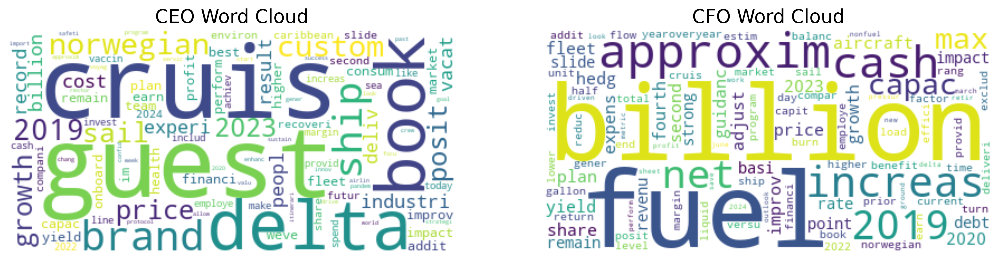

In [2993]:
def calculate_tf_idf_plot(df, ceo_column, cfo_column, company_name):
    # Initialize the TF-IDF Vectorizer with adjusted parameters
    vectorizer = TfidfVectorizer(stop_words='english', max_df=0.8, min_df=2, use_idf=True, norm=None)

    # Fit and transform the CEO text to get TF-IDF features
    vectors_ceo = vectorizer.fit_transform(df[ceo_column])
    feature_names_ceo = vectorizer.get_feature_names_out()
    dense_ceo = vectors_ceo.todense()
    denselist_ceo = dense_ceo.tolist()

    # Create a DataFrame from the dense list for CEO
    tfidf_df_ceo = pd.DataFrame(denselist_ceo, columns=feature_names_ceo)

    # Aggregate TF-IDF scores for each term across all CEO documents
    term_frequencies_ceo = tfidf_df_ceo.sum(axis=0)

    # Fit and transform the CFO text to get TF-IDF features
    vectors_cfo = vectorizer.fit_transform(df[cfo_column])
    feature_names_cfo = vectorizer.get_feature_names_out()
    dense_cfo = vectors_cfo.todense()
    denselist_cfo = dense_cfo.tolist()

    # Create a DataFrame from the dense list for CFO
    tfidf_df_cfo = pd.DataFrame(denselist_cfo, columns=feature_names_cfo)

    # Aggregate TF-IDF scores for each term across all CFO documents
    term_frequencies_cfo = tfidf_df_cfo.sum(axis=0)

    # Create a word cloud for CEO text
    wordcloud_ceo = WordCloud(background_color='white', max_words=100, contour_width=3, contour_color='steelblue')

    # Generate the word cloud for CEO text
    wordcloud_ceo.generate_from_frequencies(term_frequencies_ceo)

    # Create a word cloud for CFO text
    wordcloud_cfo = WordCloud(background_color='white', max_words=100, contour_width=3, contour_color='steelblue')

    # Generate the word cloud for CFO text
    wordcloud_cfo.generate_from_frequencies(term_frequencies_cfo)

    # Plot CEO and CFO word clouds side by side
    fig, axs = plt.subplots(1, 2, figsize=(15, 8), dpi=300)

    # Plot CEO word cloud
    axs[0].imshow(wordcloud_ceo, interpolation='bilinear')
    axs[0].set_title('CEO Word Cloud', fontsize=16)
    axs[0].axis('off')

    # Plot CFO word cloud
    axs[1].imshow(wordcloud_cfo, interpolation='bilinear')
    axs[1].set_title('CFO Word Cloud', fontsize=16)
    axs[1].axis('off')

    plt.show()

# Call the function to calculate and display the word clouds for CEO and CFO texts
calculate_tf_idf_plot(aggregated_transcripts_df, 'CEO Text Aggregated', 'CFO Text Aggregated', 'Company Name')


Table of most important terms for CEO and CFO:

In [2994]:
from tabulate import tabulate

# Initialize the TF-IDF Vectorizer with adjusted parameters for CEO
vectorizer_ceo = TfidfVectorizer(stop_words='english', max_df=0.8, min_df=2, use_idf=True, norm=None)

# Fit and transform the CEO text to get TF-IDF features
vectors_ceo = vectorizer_ceo.fit_transform(aggregated_transcripts_df['CEO Text Aggregated'])
feature_names_ceo = vectorizer_ceo.get_feature_names_out()

# Aggregate TF-IDF scores for each term across all CEO documents
term_frequencies_ceo = vectors_ceo.sum(axis=0)

# Get indices of top 20 most important words for CEO
top_20_indices_ceo = np.argsort(-term_frequencies_ceo)[:20]

# Get the corresponding words for CEO
top_20_words_ceo = [feature_names_ceo[idx] for idx in top_20_indices_ceo]

# Initialize the TF-IDF Vectorizer with adjusted parameters for CFO
vectorizer_cfo = TfidfVectorizer(stop_words='english', max_df=0.8, min_df=2, use_idf=True, norm=None)

# Fit and transform the CFO text to get TF-IDF features
vectors_cfo = vectorizer_cfo.fit_transform(aggregated_transcripts_df['CFO Text Aggregated'])
feature_names_cfo = vectorizer_cfo.get_feature_names_out()

# Aggregate TF-IDF scores for each term across all CFO documents
term_frequencies_cfo = vectors_cfo.sum(axis=0)

# Get indices of top 20 most important words for CFO
top_20_indices_cfo = np.argsort(-term_frequencies_cfo)[:20]

# Get the corresponding words for CFO
top_20_words_cfo = [feature_names_cfo[idx] for idx in top_20_indices_cfo]

# Display the list of top 20 words for CEO
print("Top 20 Most Important Words for CEO:")
print(top_20_words_ceo)

# Display the list of top 20 words for CFO
print("\nTop 20 Most Important Words for CFO:")
print(top_20_words_cfo)

Top 20 Most Important Words for CEO:
[array([['cruis', 'guest', 'delta', ..., 'mere', 'stick', 'deceler']],
      dtype=object)]

Top 20 Most Important Words for CFO:
[array([['billion', 'fuel', 'approxim', ..., 'entri', 'disconnect',
        'zero']], dtype=object)]


<a id='section3'></a>
## 3) Sentiment Analysis
--------

[Return to Top](#top)

In [2995]:
# ED PATH
# file_path = r'C:\Users\Edward Monbiot\Documents\Loughran-McDonald_MasterDictionary_1993-2023.csv'

# MATHIEU FILE PATH
file_path = 'Loughran-McDonald_MasterDictionary_1993-2023.csv'

# Read the file into a pandas DataFrame
master_dictionary_df = pd.read_csv(file_path)

# Display the first few rows of the DataFrame to verify
master_dictionary_df.head(5)

,Word,Seq_num,Word Count,Word Proportion,Average Proportion,Std Dev,Doc Count,Negative,Positive,Uncertainty,Litigious,Strong_Modal,Weak_Modal,Constraining,Complexity,Syllables,Source
0,AARDVARK,1,664,2.690000e-08,1.860000e-08,4.050000e-06,131,0,0,0,0,0,0,0,0,2,12of12inf
1,AARDVARKS,2,3,1.210000e-10,8.230000e-12,9.020000e-09,1,0,0,0,0,0,0,0,0,2,12of12inf
2,ABACI,3,9,3.640000e-10,1.110000e-10,5.160000e-08,7,0,0,0,0,0,0,0,0,3,12of12inf
3,ABACK,4,29,1.170000e-09,6.330000e-10,1.560000e-07,28,0,0,0,0,0,0,0,0,2,12of12inf
4,ABACUS,5,9349,3.790000e-07,3.830000e-07,3.460000e-05,1239,0,0,0,0,0,0,0,0,3,12of12inf


<a id='section3a'></a>
### Loughran McDonald Sentiment Analyzer Pipeline

In [2996]:
#class to perform sentiment analysis
class LoughranMcDonaldSentimentAnalyzer:
    def __init__(self, df_preprocessed, master_dictionary_df):
        self.df = df_preprocessed
        self.master_dictionary_df = master_dictionary_df
        self.sentiment_words = self._extract_sentiment_words()

    def _extract_sentiment_words(self):
        sentiments = ['Negative', 'Positive', 'Uncertainty', 'Litigious', 'Constraining']
        sentiment_words = {}
        for sentiment in sentiments:
            sentiment_words[sentiment] = set(self.master_dictionary_df[
                self.master_dictionary_df[sentiment] != 0]['Word'].str.upper().tolist())
        return sentiment_words

    def count_sentiment_words(self, text, sentiment):
        words = text.upper().split()
        return sum(word in self.sentiment_words[sentiment] for word in words)

    def apply_sentiment_analysis(self):
        for sentiment in self.sentiment_words.keys():
            self.df[f'CEO {sentiment} Count'] = self.df['CEO Text Cleaned'].apply(
                lambda x: self.count_sentiment_words(x, sentiment))
            self.df[f'CFO {sentiment} Count'] = self.df['CFO Text Cleaned'].apply(
                lambda x: self.count_sentiment_words(x, sentiment))

    def calculate_total_word_count(self):
        self.df['CEO Total Word Count'] = self.df['CEO Text Cleaned'].apply(lambda x: len(x.split()))
        self.df['CFO Total Word Count'] = self.df['CFO Text Cleaned'].apply(lambda x: len(x.split()))

    def calculate_net_sentiment_score(self):
        # Make sure to call calculate_total_word_count before this method
        self.calculate_total_word_count()
        self.df['CEO Sentiment Score'] = (self.df['CEO Positive Count'] - self.df['CEO Negative Count']) # / (self.df['CEO Positive Count'] + self.df['CEO Negative Count'])
        self.df['CFO Sentiment Score'] = (self.df['CFO Positive Count'] - self.df['CFO Negative Count']) # / (self.df['CFO Positive Count'] + self.df['CFO Negative Count'])

    def standardize_dates(self):
        self.df['Date'] = pd.to_datetime(self.df['Date'], errors='coerce').dt.date

<a id='section3b'></a>
### Apply Pipeline to RCL

In [2997]:
# Usage example
sentiment_analyzer = LoughranMcDonaldSentimentAnalyzer(df_preprocessed_rcl, master_dictionary_df)
sentiment_analyzer.apply_sentiment_analysis()
sentiment_analyzer.calculate_net_sentiment_score()
sentiment_analyzer.standardize_dates()

# Display the DataFrame to verify changes
df_lm_rcl = sentiment_analyzer.df
df_lm_rcl.head(3)

,Title,Date,CEO Text,CFO Text,Link,CEO Text Cleaned,CFO Text Cleaned,CEO Negative Count,CFO Negative Count,CEO Positive Count,...,CEO Uncertainty Count,CFO Uncertainty Count,CEO Litigious Count,CFO Litigious Count,CEO Constraining Count,CFO Constraining Count,CEO Total Word Count,CFO Total Word Count,CEO Sentiment Score,CFO Sentiment Score
0,Royal Caribbean Cruises (RCL) Q4 2023 Earnings...,2024-02-01,"Thank you, Michael, and good morning, everyone...","Thank you, Jason, and good morning everyone. L...",https://www.fool.com/earnings/call-transcripts...,thank michael good morn everyon get detail wou...,thank jason good morn everyon let start review...,2,6,36,...,0,3,1,2,2,2,1114,931,34,11
1,Royal Caribbean Cruises (RCL) Q3 2023 Earnings...,2023-10-26,"Thank you, Michael, and good morning, everyone...","Thank you, Jason, and good morning, everyone. ...",https://www.fool.com/earnings/call-transcripts...,thank michael good morn everyon begin today wo...,thank jason good morn everyon let start thirdq...,7,3,44,...,0,1,2,0,1,2,1076,837,37,13
2,Royal Caribbean Cruises (RCL) Q2 2023 Earnings...,2023-07-27,"Thank you, Michael, and good morning, everyone...","Thank you, Jason, and good morning, everyone. ...",https://www.fool.com/earnings/call-transcripts...,thank michael good morn everyon im thrill shar...,thank jason good morn everyon begin discuss re...,4,1,37,...,3,2,2,0,1,1,816,734,33,16


<a id='section3c'></a>
### Apply Pipeline to NCLH

In [2998]:

# Usage example
sentiment_analyzer = LoughranMcDonaldSentimentAnalyzer(df_preprocessed_nclh, master_dictionary_df)
sentiment_analyzer.apply_sentiment_analysis()
sentiment_analyzer.calculate_net_sentiment_score()
sentiment_analyzer.standardize_dates()

# Display the DataFrame to verify changes
df_lm_nclh = sentiment_analyzer.df
df_lm_nclh.head(3)


,Title,Date,CEO Text,CFO Text,Link,CEO Text Cleaned,CFO Text Cleaned,CEO Negative Count,CFO Negative Count,CEO Positive Count,...,CEO Uncertainty Count,CFO Uncertainty Count,CEO Litigious Count,CFO Litigious Count,CEO Constraining Count,CFO Constraining Count,CEO Total Word Count,CFO Total Word Count,CEO Sentiment Score,CFO Sentiment Score
0,Norwegian Cruise Line (NCLH) Q4 2023 Earnings ...,2024-02-27,"Well, thank you, Sarah, and good morning, ever...","Thank you, Harry, and good morning, everyone. ...",https://www.fool.com/earnings/call-transcripts...,well thank sarah good morn everyon thank join ...,thank harri good morn everyon commentari today...,6,4,36,...,3,4,1,1,3,3,1064,1023,30,17
1,Norwegian Cruise Line (NCLH) Q3 2023 Earnings ...,2023-11-01,"Well, thank you, Jessica, and good morning, ev...","Thank you, Harry, and good morning, everyone. ...",https://www.fool.com/earnings/call-transcripts...,well thank jessica good morn everyon thank joi...,thank harri good morn everyon commentari today...,19,9,31,...,1,0,4,3,4,1,1314,814,12,6
2,Norwegian Cruise Line (NCLH) Q2 2023 Earnings ...,2023-08-01,"Well, thank you, Jessica, and good morning, ev...","Thank you, Harry, and good morning, everyone. ...",https://www.fool.com/earnings/call-transcripts...,well thank jessica good morn everyon thank joi...,thank harri good morn everyon commentari today...,9,5,34,...,4,1,3,2,2,4,1298,991,25,12


<a id='section3d'></a>
### Apply Pipeline to DAL

In [2999]:
sentiment_analyzer = LoughranMcDonaldSentimentAnalyzer(df_preprocessed_dal, master_dictionary_df)
sentiment_analyzer.apply_sentiment_analysis()
sentiment_analyzer.calculate_net_sentiment_score()
sentiment_analyzer.standardize_dates()

# Display the DataFrame to verify changes
df_lm_dal = sentiment_analyzer.df
df_lm_dal.head(3)

,Title,Date,CEO Text,CFO Text,Link,CEO Text Cleaned,CFO Text Cleaned,CEO Negative Count,CFO Negative Count,CEO Positive Count,...,CEO Uncertainty Count,CFO Uncertainty Count,CEO Litigious Count,CFO Litigious Count,CEO Constraining Count,CFO Constraining Count,CEO Total Word Count,CFO Total Word Count,CEO Sentiment Score,CFO Sentiment Score
0,Delta Air Lines (DAL) Q4 2023 Earnings Call Tr...,2024-01-12,"Well, thank you, Julie, and good morning, ever...","Thank you, Glen, and good morning to everyone....",https://www.fool.com/earnings/call-transcripts...,well thank juli good morn everyon appreci join...,thank glen good morn everyon 2023 anoth meanin...,3,0,14,...,2,0,0,1,0,1,669,477,11,5
1,Delta Air Lines (DAL) Q3 2023 Earnings Call Tr...,2023-10-12,"Well, thank you, Julie, and good morning, ever...","Thank you, Glen, and good morning to everyone....",https://www.fool.com/earnings/call-transcripts...,well thank juli good morn everyon appreci join...,thank glen good morn everyon septemb quarter d...,6,1,12,...,0,0,0,0,1,1,563,427,6,9
2,Delta Air Lines (DAL) Q2 2023 Earnings Call Tr...,2023-07-13,"Thanks, Julie. Good morning, everyone. We appr...","Great. Thank you, Glen, and good morning to ev...",https://www.fool.com/earnings/call-transcripts...,thank juli good morn everyon appreci join us t...,great thank glen good morn everyon june quarte...,1,2,21,...,1,0,0,0,3,0,501,370,20,5


<a id='section3e'></a>
### Apply Pipeline to LUV

In [3000]:
# Usage example
sentiment_analyzer = LoughranMcDonaldSentimentAnalyzer(df_preprocessed_luv, master_dictionary_df)
sentiment_analyzer.apply_sentiment_analysis()
sentiment_analyzer.calculate_net_sentiment_score()
sentiment_analyzer.standardize_dates()

# Display the DataFrame to verify changes
df_lm_luv = sentiment_analyzer.df
df_lm_luv.head(3)

,Title,Date,CEO Text,CFO Text,Link,CEO Text Cleaned,CFO Text Cleaned,CEO Negative Count,CFO Negative Count,CEO Positive Count,...,CEO Uncertainty Count,CFO Uncertainty Count,CEO Litigious Count,CFO Litigious Count,CEO Constraining Count,CFO Constraining Count,CEO Total Word Count,CFO Total Word Count,CEO Sentiment Score,CFO Sentiment Score
0,Southwest Airlines (LUV) Q4 2023 Earnings Call...,2024-01-25,"Thank you, Julie, and thank you, everyone, for...","Thank you, Bob, and hello, everyone. As Bob me...",https://www.fool.com/earnings/call-transcripts...,thank juli thank everyon join call today close...,thank bob hello everyon bob mention 2023 wasnt...,7,3,17,...,0,1,2,3,1,0,513,850,10,14
1,Southwest Airlines (LUV) Q3 2023 Earnings Call...,2023-10-26,"Well, thanks, Julia, and good morning, everyon...","Thank you, Bob, and hello, everyone. First, I ...",https://www.fool.com/earnings/call-transcripts...,well thank julia good morn everyon jump financ...,thank bob hello everyon first would like exten...,3,2,11,...,0,0,1,0,0,1,364,501,8,3
2,Southwest Airlines (LUV) Q2 2023 Earnings Call...,2023-07-27,"Thanks Julia, and good morning, everyone. I ap...","Thank you, Bob, and hello, everyone. First, I'...",https://www.fool.com/earnings/call-transcripts...,thank julia good morn everyon appreci join us ...,thank bob hello everyon first id like extend a...,7,0,9,...,1,0,1,0,0,0,484,581,2,5


<a id='section4'></a>
## 4) CEO & CFO Sentiment Graphs
---------

[Return to Top](#top)

The Sentiment Score is computed as follows: 

$$
\text{Sentiment Score} = \frac{{\text{Positive Count} - \text{Negative Count}}}{{\text{Total Count}}}
$$



RCL

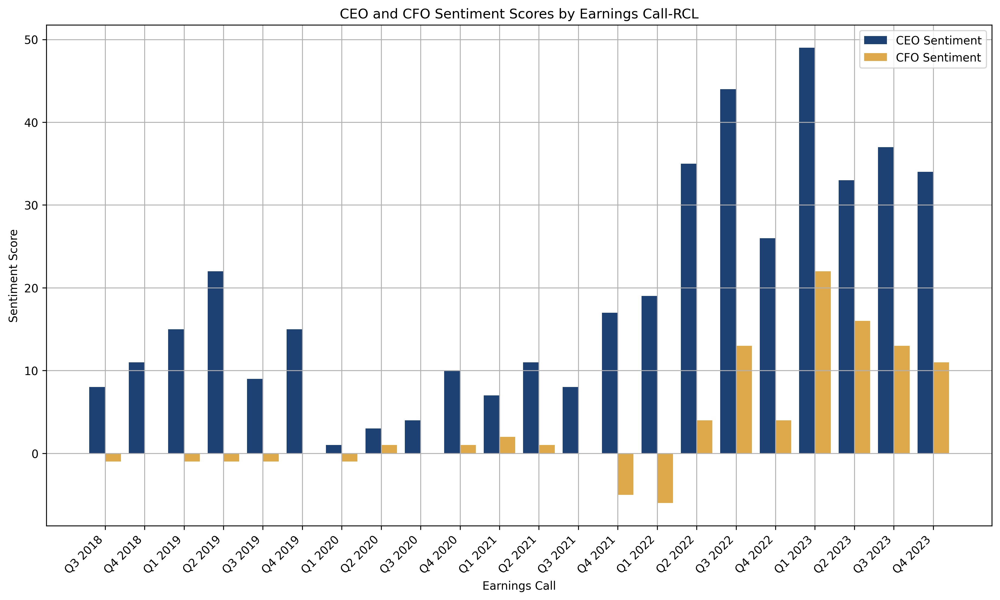

In [3001]:
# Sort the DataFrame by 'Date'
df_lm_rcl.sort_values('Date', inplace=True)

# Extracting relevant part from the 'Title'
df_lm_rcl['Earnings Call'] = df_lm_rcl['Title'].str.extract(r'\(RCL\) (.*?) Earnings')

plt.figure(figsize=(15, 8), dpi=300)  # Adjust the figure size as needed

# Plotting bar chart
x = range(len(df_lm_rcl))
plt.bar([a - 0.2 for a in x], df_lm_rcl['CEO Sentiment Score'], width=0.4, label='CEO Sentiment', align='center', color=ceo)
plt.bar([a + 0.2 for a in x], df_lm_rcl['CFO Sentiment Score'], width=0.4, label='CFO Sentiment', align='center', color=cfo)

# Formatting the plot
plt.xlabel('Earnings Call')
plt.ylabel('Sentiment Score')
plt.title('CEO and CFO Sentiment Scores by Earnings Call-RCL')
plt.xticks(x, df_lm_rcl['Earnings Call'], rotation=45, ha='right')  # Use the extracted part for x-axis labels
plt.legend()
plt.grid(True)

plt.show()


NCLH

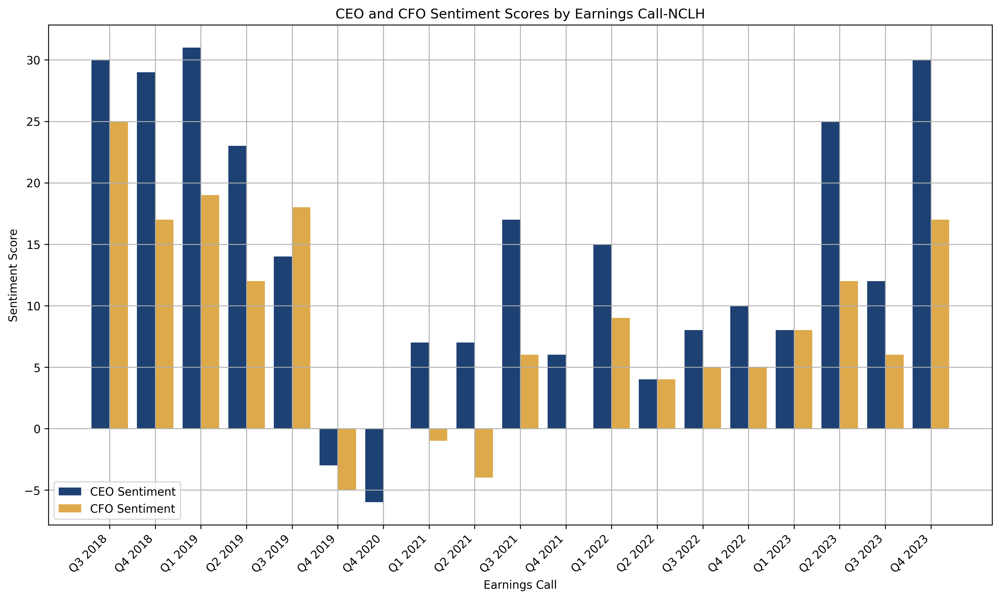

In [3002]:
# Sort the DataFrame by 'Date'
df_lm_nclh.sort_values('Date', inplace=True)

# Extracting relevant part from the 'Title'
df_lm_nclh['Earnings Call'] = df_lm_nclh['Title'].str.extract(r'\(NCLH\) (.*?) Earnings')

plt.figure(figsize=(15, 8), dpi=300)  # Adjust the figure size as needed

# Plotting bar chart
x = range(len(df_lm_nclh))
plt.bar([a - 0.2 for a in x], df_lm_nclh['CEO Sentiment Score'], width=0.4, label='CEO Sentiment', align='center', color=ceo)
plt.bar([a + 0.2 for a in x], df_lm_nclh['CFO Sentiment Score'], width=0.4, label='CFO Sentiment', align='center', color=cfo)

# Formatting the plot
plt.xlabel('Earnings Call')
plt.ylabel('Sentiment Score')
plt.title('CEO and CFO Sentiment Scores by Earnings Call-NCLH')
plt.xticks(x, df_lm_nclh['Earnings Call'], rotation=45, ha='right')  # Use the extracted part for x-axis labels
plt.legend()
plt.grid(True)

# Show the plot
plt.show()

DAL

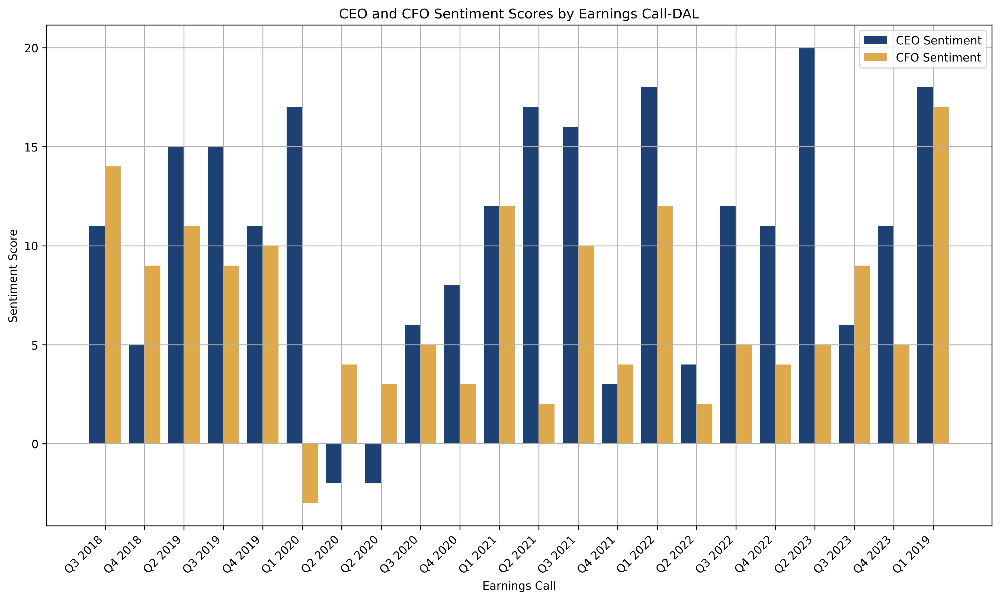

In [3003]:
# Sort the DataFrame by 'Date'
df_lm_dal.sort_values('Date', inplace=True)

# Extracting relevant part from the 'Title'
df_lm_dal['Earnings Call'] = df_lm_dal['Title'].str.extract(r'\(DAL\) (.*?) Earnings')

plt.figure(figsize=(15, 8), dpi=300)  # Adjust the figure size as needed

# Plotting bar chart
x = range(len(df_lm_dal))
plt.bar([a - 0.2 for a in x], df_lm_dal['CEO Sentiment Score'], width=0.4, label='CEO Sentiment', align='center', color=ceo)
plt.bar([a + 0.2 for a in x], df_lm_dal['CFO Sentiment Score'], width=0.4, label='CFO Sentiment', align='center', color=cfo)

# Formatting the plot
plt.xlabel('Earnings Call')
plt.ylabel('Sentiment Score')
plt.title('CEO and CFO Sentiment Scores by Earnings Call-DAL')
plt.xticks(x, df_lm_dal['Earnings Call'], rotation=45, ha='right')  # Use the extracted part for x-axis labels
plt.legend()
plt.grid(True)

# Show the plot
plt.show()

LUV

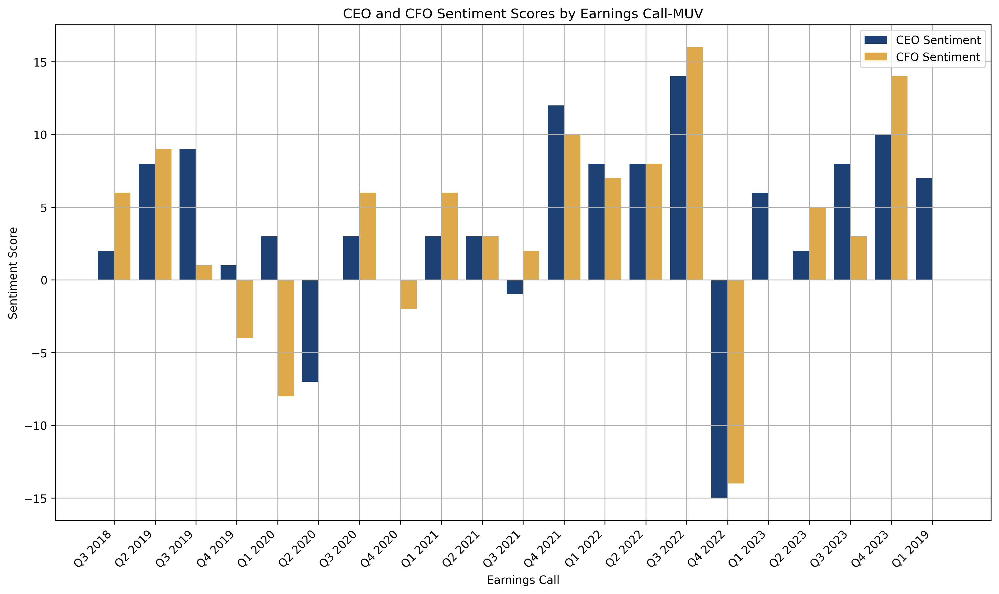

In [3004]:
# Sort the DataFrame by 'Date'
df_lm_luv.sort_values('Date', inplace=True)

# Extracting relevant part from the 'Title'
df_lm_luv['Earnings Call'] = df_lm_luv['Title'].str.extract(r'\(LUV\) (.*?) Earnings')

plt.figure(figsize=(15, 8), dpi=300)  # Adjust the figure size as needed

# Plotting bar chart
x = range(len(df_lm_luv))
plt.bar([a - 0.2 for a in x], df_lm_luv['CEO Sentiment Score'], width=0.4, label='CEO Sentiment', align='center', color=ceo)
plt.bar([a + 0.2 for a in x], df_lm_luv['CFO Sentiment Score'], width=0.4, label='CFO Sentiment', align='center', color=cfo)

# Formatting the plot
plt.xlabel('Earnings Call')
plt.ylabel('Sentiment Score')
plt.title('CEO and CFO Sentiment Scores by Earnings Call-MUV')
plt.xticks(x, df_lm_luv['Earnings Call'], rotation=45, ha='right')  # Use the extracted part for x-axis labels
plt.legend()
plt.grid(True)

# Show the plot
plt.show()

<a id='section4a'></a>
### Define COVID Timelines
--------

14th March 2020: CDC Issues No Sail Order
15th March 2022: CDC Drops cruise health travel warning notice 

source: https://cruiseindustrynews.com/cruise-news/2022/08/cdc-cruise-ship-timeline-from-no-sail-to-the-end-of-covid-19-program/

We define here the 3 different periods of our analysis:
+ Pre Covid
+ Covid Lockdown
+ Post Covid

In [3005]:
from datetime import datetime
import pandas as pd

# Defining the date ranges
pre_covid = (datetime(2018, 6, 1), datetime(2020, 3, 14))
covid_lockdowns = (datetime(2020, 3, 14), datetime(2022, 3, 15))
post_covid = (datetime(2022, 3, 15), datetime.now())

# Creating a DataFrame to hold these periods
covid_periods_df = pd.DataFrame({
    'Period': ['Pre-COVID', 'COVID Lockdowns', 'Post-COVID'],
    'Start Date': [pre_covid[0], covid_lockdowns[0], post_covid[0]],
    'End Date': [pre_covid[1], covid_lockdowns[1], post_covid[1]]
})

covid_periods_df



,Period,Start Date,End Date
0,Pre-COVID,2018-06-01,2020-03-14 00:00:00.000000
1,COVID Lockdowns,2020-03-14,2022-03-15 00:00:00.000000
2,Post-COVID,2022-03-15,2024-03-17 01:39:21.651579


<a id='section4b'></a>
### CEO and CFO Sentiment Scores Plots
-------

RCL

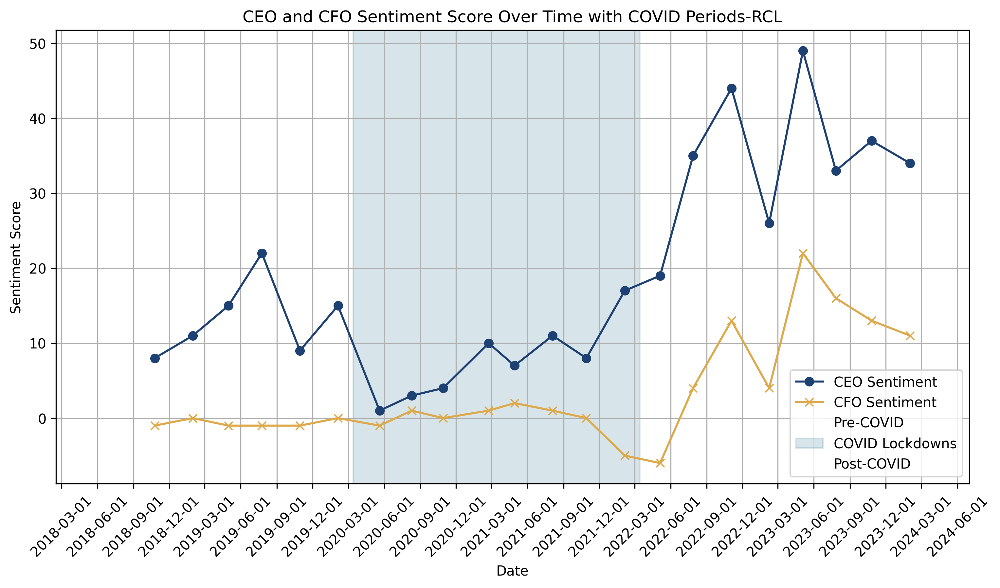

In [3006]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import pandas as pd

# Assuming df_lm is already loaded

# Convert 'Date' to datetime and sort the DataFrame by 'Date'
df_lm_rcl['Date'] = pd.to_datetime(df_lm_rcl['Date'], errors='coerce')
df_lm_rcl.dropna(subset=['Date'], inplace=True)
df_lm_rcl.sort_values('Date', inplace=True)

# Plotting
plt.figure(figsize=(12, 6), dpi=300)
plt.plot(df_lm_rcl['Date'], df_lm_rcl['CEO Sentiment Score'], label='CEO Sentiment', linestyle='-', marker='o', color = ceo)
plt.plot(df_lm_rcl['Date'], df_lm_rcl['CFO Sentiment Score'], label='CFO Sentiment', linestyle='-', marker='x', color = cfo)

# Adding background color for different periods using data from covid_periods_df
for index, row in covid_periods_df.iterrows():
    plt.axvspan(row['Start Date'], row['End Date'], color=['white', bse, 'white'][index], alpha=0.2, label=row['Period'])

# Formatting the plot
plt.xlabel('Date')
plt.ylabel('Sentiment Score')
plt.title('CEO and CFO Sentiment Score Over Time with COVID Periods-RCL')
plt.legend(loc='lower right')  # This moves the legend to the right down corner
plt.grid(True)

# Improve date formatting on the x-axis
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
plt.gca().xaxis.set_major_locator(mdates.MonthLocator(interval=3))
plt.xticks(rotation=45)

# Show the plot
plt.show()


NCLH

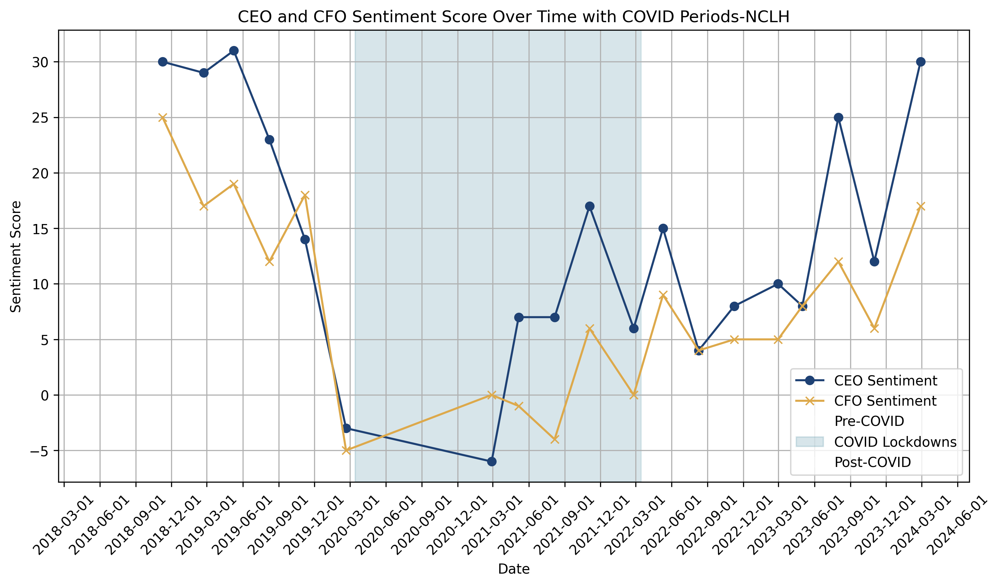

In [3007]:
# Convert 'Date' to datetime and sort the DataFrame by 'Date'
df_lm_nclh['Date'] = pd.to_datetime(df_lm_nclh['Date'], errors='coerce')
df_lm_nclh.dropna(subset=['Date'], inplace=True)
df_lm_nclh.sort_values('Date', inplace=True)

# Plotting
plt.figure(figsize=(12, 6), dpi=300)
plt.plot(df_lm_nclh['Date'], df_lm_nclh['CEO Sentiment Score'], label='CEO Sentiment', linestyle='-', marker='o', color = ceo)
plt.plot(df_lm_nclh['Date'], df_lm_nclh['CFO Sentiment Score'], label='CFO Sentiment', linestyle='-', marker='x', color = cfo)

# Adding background color for different periods using data from covid_periods_df
for index, row in covid_periods_df.iterrows():
    plt.axvspan(row['Start Date'], row['End Date'], color=['white', bse, 'white'][index], alpha=0.2, label=row['Period'])

# Formatting the plot
plt.xlabel('Date')
plt.ylabel('Sentiment Score')
plt.title('CEO and CFO Sentiment Score Over Time with COVID Periods-NCLH')
plt.legend(loc='lower right')  # This moves the legend to the right down corner
plt.grid(True)

# Improve date formatting on the x-axis
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
plt.gca().xaxis.set_major_locator(mdates.MonthLocator(interval=3))
plt.xticks(rotation=45)

# Show the plot
plt.show()


DAL

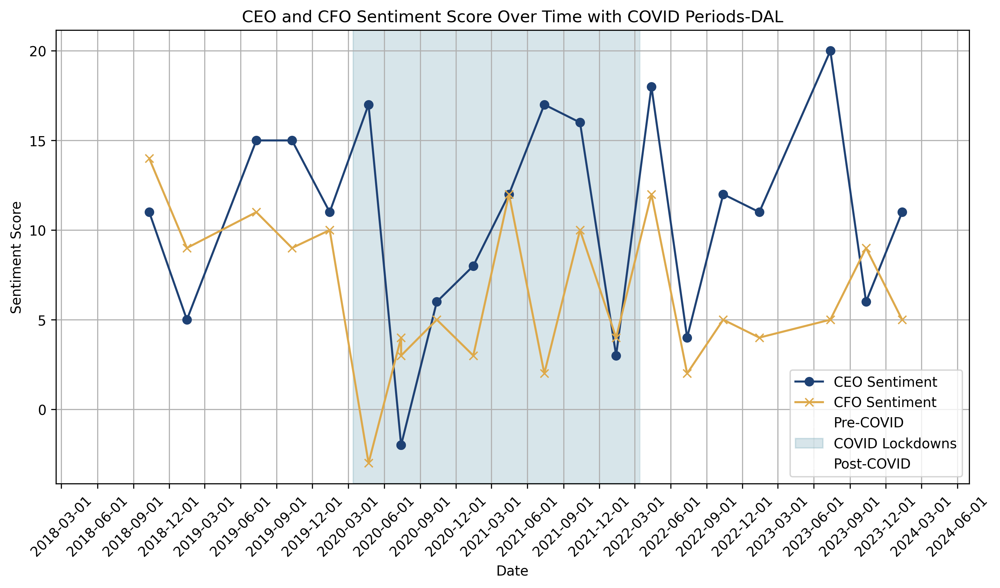

In [3008]:
# Convert 'Date' to datetime and sort the DataFrame by 'Date'
df_lm_dal['Date'] = pd.to_datetime(df_lm_dal['Date'], errors='coerce')
df_lm_dal.dropna(subset=['Date'], inplace=True)
df_lm_dal.sort_values('Date', inplace=True)

# Plotting
plt.figure(figsize=(12, 6), dpi=300)
plt.plot(df_lm_dal['Date'], df_lm_dal['CEO Sentiment Score'], label='CEO Sentiment', linestyle='-', marker='o', color = ceo)
plt.plot(df_lm_dal['Date'], df_lm_dal['CFO Sentiment Score'], label='CFO Sentiment', linestyle='-', marker='x', color = cfo)

# Adding background color for different periods using data from covid_periods_df
for index, row in covid_periods_df.iterrows():
    plt.axvspan(row['Start Date'], row['End Date'], color=['white', bse, 'white'][index], alpha=0.2, label=row['Period'])

# Formatting the plot
plt.xlabel('Date')
plt.ylabel('Sentiment Score')
plt.title('CEO and CFO Sentiment Score Over Time with COVID Periods-DAL')
plt.legend(loc='lower right')  # This moves the legend to the right down corner
plt.grid(True)

# Improve date formatting on the x-axis
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
plt.gca().xaxis.set_major_locator(mdates.MonthLocator(interval=3))
plt.xticks(rotation=45)

# Show the plot
plt.show()


LUV

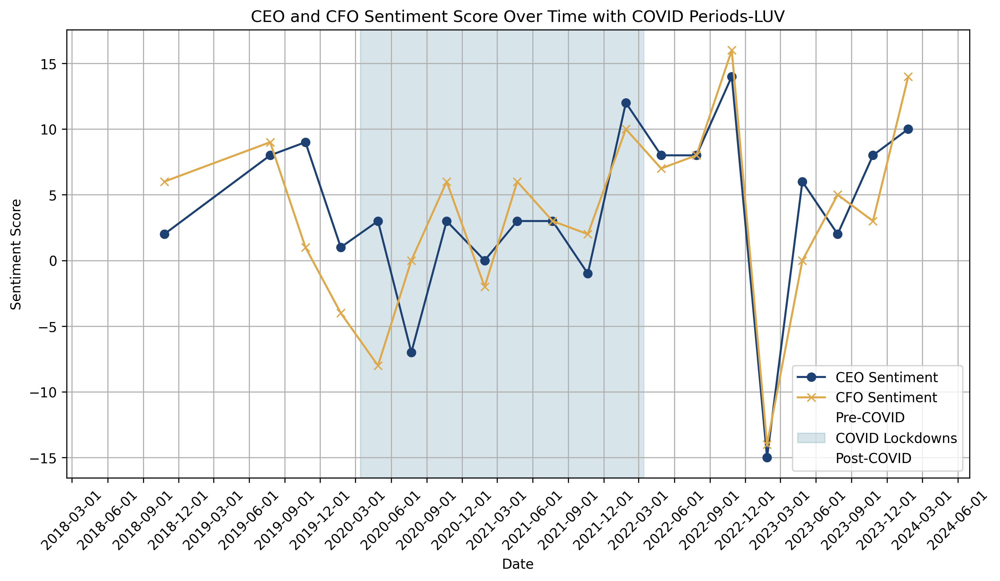

In [3009]:
# Convert 'Date' to datetime and sort the DataFrame by 'Date'
df_lm_luv['Date'] = pd.to_datetime(df_lm_luv['Date'], errors='coerce')
df_lm_luv.dropna(subset=['Date'], inplace=True)
df_lm_luv.sort_values('Date', inplace=True)

# Plotting
plt.figure(figsize=(12, 6), dpi=300)
plt.plot(df_lm_luv['Date'], df_lm_luv['CEO Sentiment Score'], label='CEO Sentiment', linestyle='-', marker='o', color = ceo)
plt.plot(df_lm_luv['Date'], df_lm_luv['CFO Sentiment Score'], label='CFO Sentiment', linestyle='-', marker='x', color = cfo)

# Adding background color for different periods using data from covid_periods_df
for index, row in covid_periods_df.iterrows():
    plt.axvspan(row['Start Date'], row['End Date'], color=['white', bse, 'white'][index], alpha=0.2, label=row['Period'])

# Formatting the plot
plt.xlabel('Date')
plt.ylabel('Sentiment Score')
plt.title('CEO and CFO Sentiment Score Over Time with COVID Periods-LUV')
plt.legend(loc='lower right')  # This moves the legend to the right down corner
plt.grid(True)

# Improve date formatting on the x-axis
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
plt.gca().xaxis.set_major_locator(mdates.MonthLocator(interval=3))
plt.xticks(rotation=45)

# Show the plot
plt.show()

<a id='section4c'></a>
### Add Financial Data to the Plots
----------

We use yahoo.finance API to collect the share price of the different companies

In [3011]:
#!pip install yfinance
import yfinance as yf
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

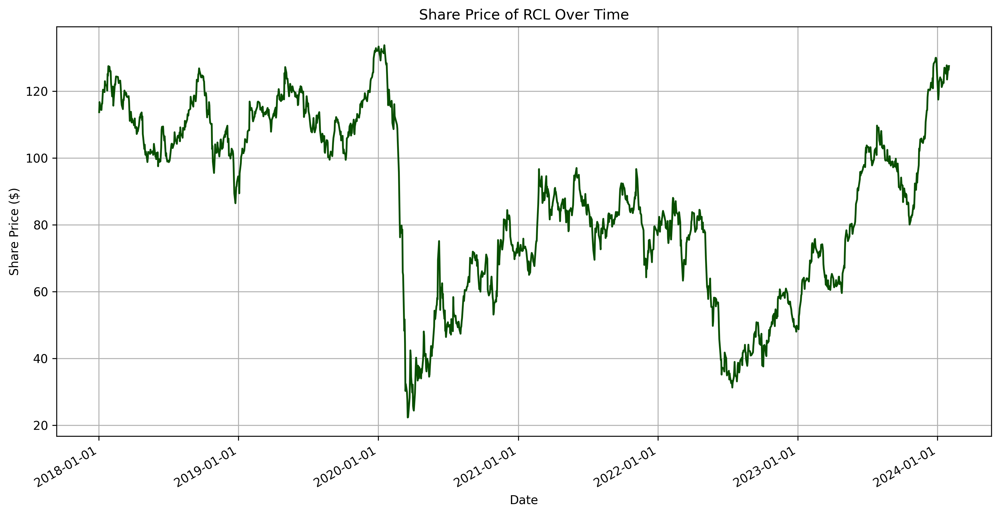

In [3012]:
# Define the ticker symbol for Norwegian Cruise Line Holdings Ltd.
ticker_symbol = 'RCL'

# Get data on this ticker
ticker_data = yf.Ticker(ticker_symbol)

# Define the start and end dates for the time period you're interested in.
start_date = '2018-01-01'
end_date = '2024-02-01'

# Get the historical prices for this ticker within the specified time frame
rcl_df = ticker_data.history(start=start_date, end=end_date)

# Reset the index to make 'Date' a column
rcl_df.reset_index(inplace=True)

# Convert 'Date' to just a date format without the time
rcl_df['Date'] = pd.to_datetime(rcl_df['Date']).dt.date

# Select only the 'Date' and 'Close' columns
nrcl_share_price_df = rcl_df[['Date', 'Close']]

# Rename 'Close' to 'Share Price' for clarity
nrcl_share_price_df.rename(columns={'Close': 'Share Price'}, inplace=True)


# Plotting the share price data
plt.figure(figsize=(14, 7), dpi=300)
plt.plot_date(nrcl_share_price_df['Date'], nrcl_share_price_df['Share Price'], linestyle='solid', marker=None, color = prices)

# Formatting the plot
plt.title('Share Price of RCL Over Time')
plt.xlabel('Date')
plt.ylabel('Share Price ($)')
plt.grid(True)

# Improve date formatting on the x-axis
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
plt.gca().xaxis.set_major_locator(mdates.YearLocator())  # Shows each year on the x-axis
plt.gcf().autofmt_xdate()  # Auto-rotates the dates to show them more clearly

# Show the plot
plt.show()


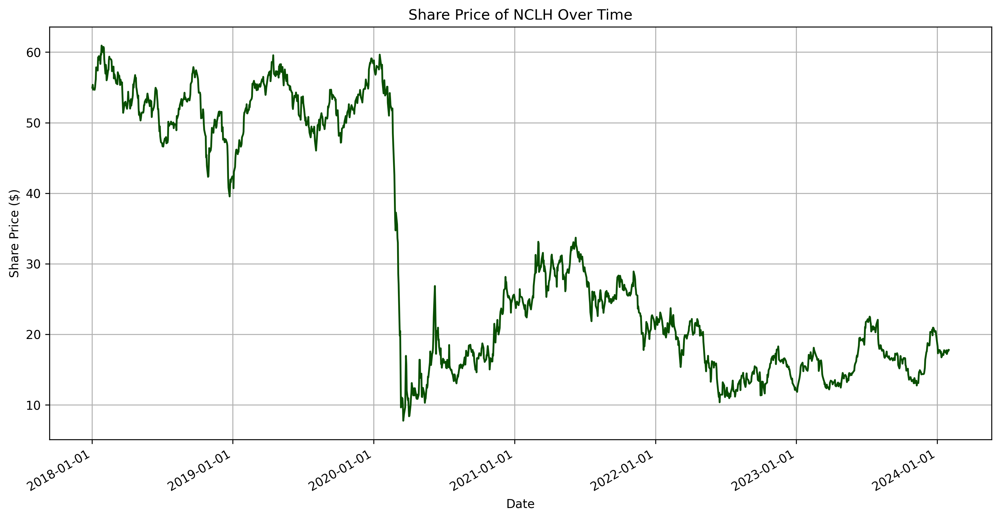

In [3013]:
# Define the ticker symbol for Norwegian Cruise Line Holdings Ltd.
ticker_symbol = 'NCLH'

# Get data on this ticker
ticker_data = yf.Ticker(ticker_symbol)

# Define the start and end dates for the time period you're interested in.
start_date = '2018-01-01'
end_date = '2024-02-01'

# Get the historical prices for this ticker within the specified time frame
nclh_df = ticker_data.history(start=start_date, end=end_date)

# Reset the index to make 'Date' a column
nclh_df.reset_index(inplace=True)

# Convert 'Date' to just a date format without the time
nclh_df['Date'] = pd.to_datetime(nclh_df['Date']).dt.date

# Select only the 'Date' and 'Close' columns
nclh_share_price_df = nclh_df[['Date', 'Close']]

# Rename 'Close' to 'Share Price' for clarity
nclh_share_price_df.rename(columns={'Close': 'Share Price'}, inplace=True)

# Plotting the share price data
plt.figure(figsize=(14, 7), dpi=300)
plt.plot_date(nclh_share_price_df['Date'], nclh_share_price_df['Share Price'], linestyle='solid', marker=None, color = prices)

# Formatting the plot
plt.title('Share Price of NCLH Over Time')
plt.xlabel('Date')
plt.ylabel('Share Price ($)')
plt.grid(True)

# Improve date formatting on the x-axis
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
plt.gca().xaxis.set_major_locator(mdates.YearLocator())
plt.gcf().autofmt_xdate()

# Show the plot
plt.show()


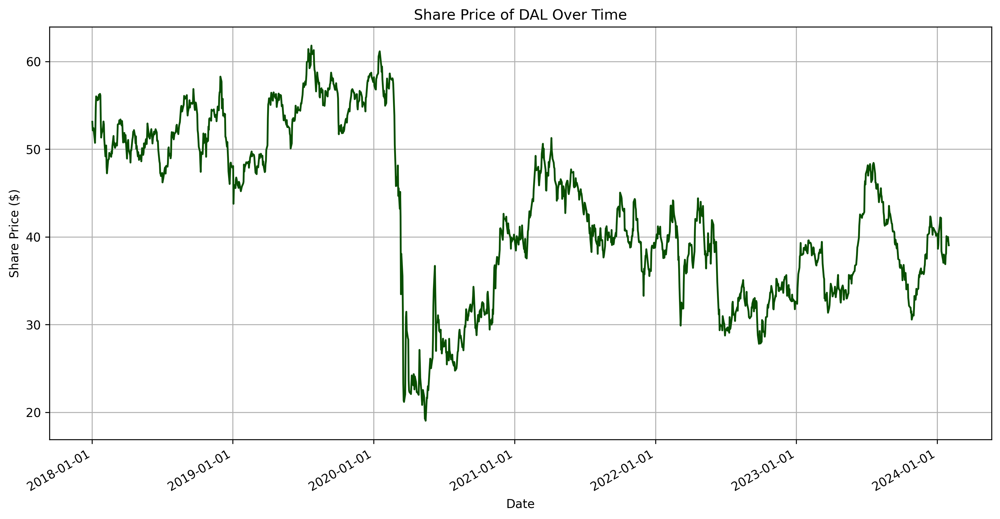

In [3014]:
# Define the ticker symbol for Norwegian Cruise Line Holdings Ltd.
ticker_symbol = 'DAL'

# Get data on this ticker
ticker_data = yf.Ticker(ticker_symbol)

# Define the start and end dates for the time period you're interested in.
start_date = '2018-01-01'
end_date = '2024-02-01'

# Get the historical prices for this ticker within the specified time frame
dal_df = ticker_data.history(start=start_date, end=end_date)

# Reset the index to make 'Date' a column
dal_df.reset_index(inplace=True)

# Convert 'Date' to just a date format without the time
dal_df['Date'] = pd.to_datetime(dal_df['Date']).dt.date

# Select only the 'Date' and 'Close' columns
dal_share_price_df = dal_df[['Date', 'Close']]

# Rename 'Close' to 'Share Price' for clarity
dal_share_price_df.rename(columns={'Close': 'Share Price'}, inplace=True)

# Plotting the share price data
plt.figure(figsize=(14, 7), dpi=300)
plt.plot_date(dal_share_price_df['Date'], dal_share_price_df['Share Price'], linestyle='solid', marker=None, color = prices)

# Formatting the plot
plt.title('Share Price of DAL Over Time')
plt.xlabel('Date')
plt.ylabel('Share Price ($)')
plt.grid(True)

# Improve date formatting on the x-axis
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
plt.gca().xaxis.set_major_locator(mdates.YearLocator())
plt.gcf().autofmt_xdate()

# Show the plot
plt.show()


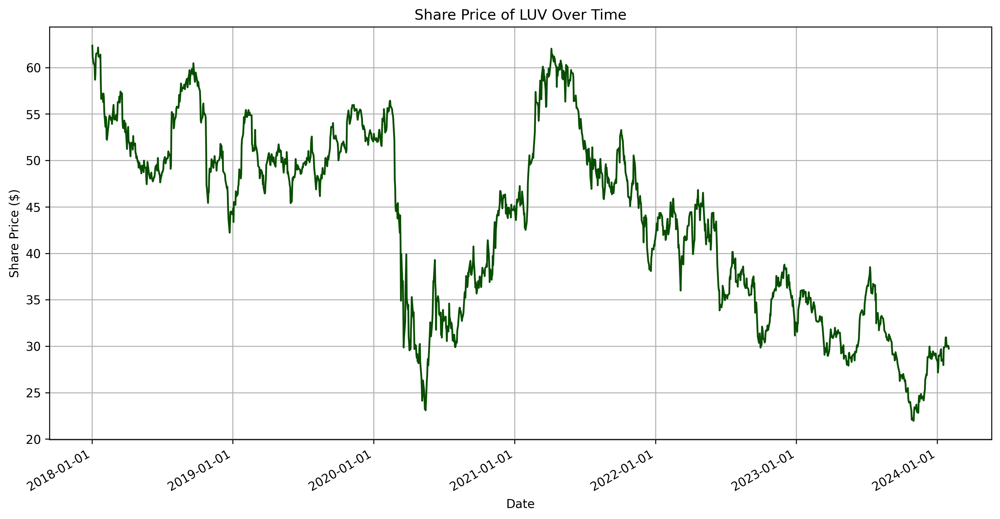

In [3015]:
# Define the ticker symbol for Norwegian Cruise Line Holdings Ltd.
ticker_symbol = 'LUV'

# Get data on this ticker
ticker_data = yf.Ticker(ticker_symbol)

# Define the start and end dates for the time period you're interested in.
start_date = '2018-01-01'
end_date = '2024-02-01'

# Get the historical prices for this ticker within the specified time frame
luv_df = ticker_data.history(start=start_date, end=end_date)

# Reset the index to make 'Date' a column
luv_df.reset_index(inplace=True)

# Convert 'Date' to just a date format without the time
luv_df['Date'] = pd.to_datetime(luv_df['Date']).dt.date

# Select only the 'Date' and 'Close' columns
luv_share_price_df = luv_df[['Date', 'Close']]

# Rename 'Close' to 'Share Price' for clarity
luv_share_price_df.rename(columns={'Close': 'Share Price'}, inplace=True)


# Plotting the share price data
plt.figure(figsize=(14, 7), dpi=300)
plt.plot_date(luv_share_price_df['Date'], luv_share_price_df['Share Price'], linestyle='solid', marker=None, color = prices)

# Formatting the plot
plt.title('Share Price of LUV Over Time')
plt.xlabel('Date')
plt.ylabel('Share Price ($)')
plt.grid(True)

# Improve date formatting on the x-axis
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
plt.gca().xaxis.set_major_locator(mdates.YearLocator())  # Shows each year on the x-axis
plt.gcf().autofmt_xdate()  # Auto-rotates the dates to show them more clearly

# Show the plot
plt.show()


Plot Trading Volumes

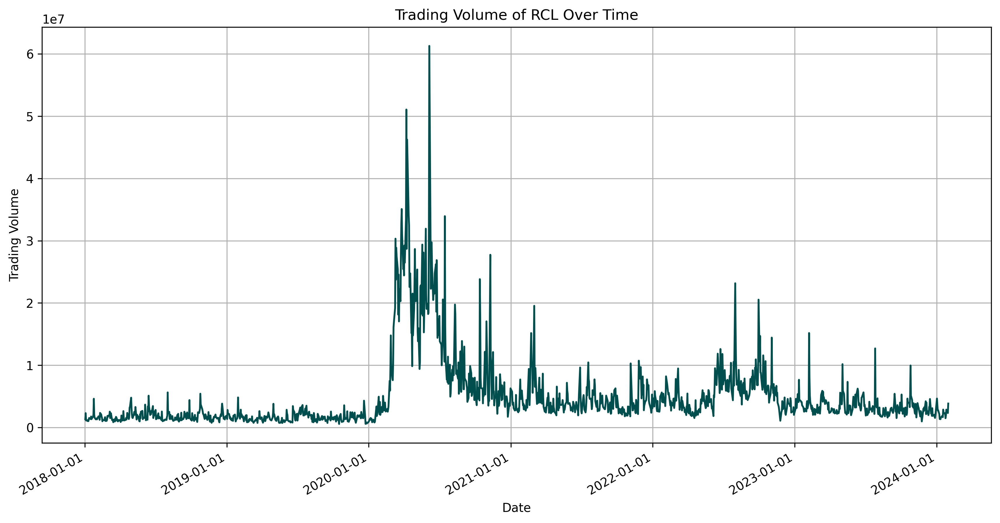

In [3016]:
# Extracting the Trading Volume data
rcl_volume_df = rcl_df[['Date', 'Volume']]

# Plotting the trading volume data
plt.figure(figsize=(14, 7), dpi=300)
plt.plot_date(rcl_volume_df['Date'], rcl_volume_df['Volume'], linestyle='solid', marker=None, color = volumes)  # Use 'Volume'

# Formatting the plot
plt.title('Trading Volume of RCL Over Time')
plt.xlabel('Date')
plt.ylabel('Trading Volume')
plt.grid(True)

# Improve date formatting on the x-axis
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
plt.gca().xaxis.set_major_locator(mdates.YearLocator())  # Shows each year on the x-axis
plt.gcf().autofmt_xdate()  # Auto-rotates the dates to show them more clearly

# Show the plot
plt.show()


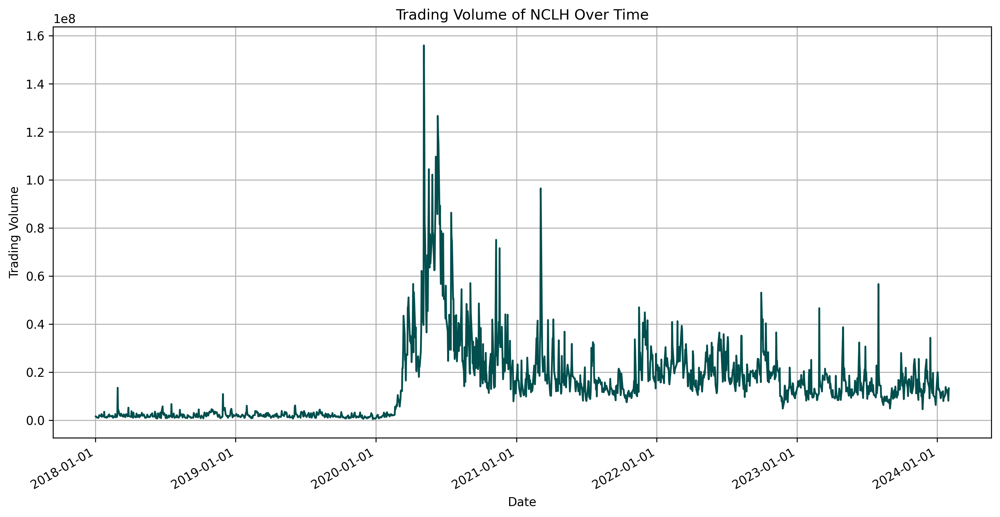

In [3017]:
# Extracting the Trading Volume data
nclh_volume_df = nclh_df[['Date', 'Volume']]

# Plotting the trading volume data
plt.figure(figsize=(14, 7), dpi=300)
plt.plot_date(nclh_volume_df['Date'], nclh_volume_df['Volume'], linestyle='solid', marker=None, color=volumes)

# Formatting the plot
plt.title('Trading Volume of NCLH Over Time')
plt.xlabel('Date')
plt.ylabel('Trading Volume')
plt.grid(True)

# Improve date formatting on the x-axis
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
plt.gca().xaxis.set_major_locator(mdates.YearLocator())
plt.gcf().autofmt_xdate()  # Auto-rotates the dates to show them more clearly

# Show the plot
plt.show()


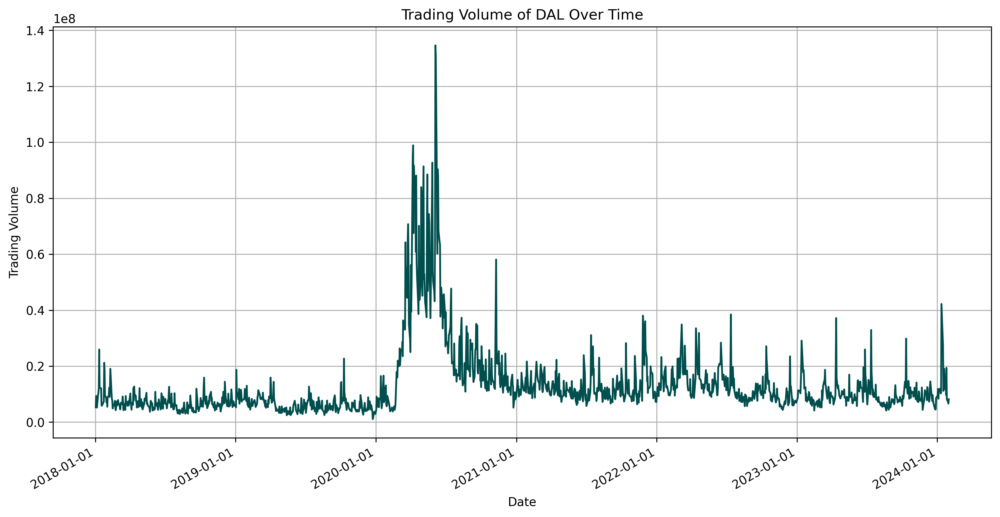

In [3018]:
# Extracting the Trading Volume data
dal_volume_df = dal_df[['Date', 'Volume']]

# Plotting the trading volume data
plt.figure(figsize=(14, 7), dpi=300)
plt.plot_date(dal_volume_df['Date'], dal_volume_df['Volume'], linestyle='solid', marker=None, color=volumes)

# Formatting the plot
plt.title('Trading Volume of DAL Over Time')
plt.xlabel('Date')
plt.ylabel('Trading Volume')
plt.grid(True)

# Improve date formatting on the x-axis
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
plt.gca().xaxis.set_major_locator(mdates.YearLocator())
plt.gcf().autofmt_xdate()  # Auto-rotates the dates to show them more clearly

# Show the plot
plt.show()


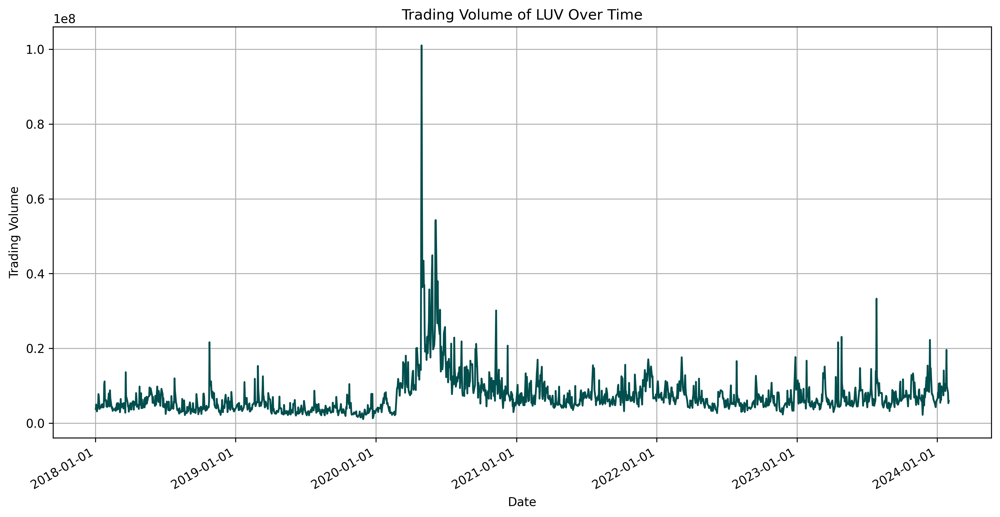

In [3019]:
# Extracting the Trading Volume data
luv_volume_df = luv_df[['Date', 'Volume']]

# Plotting the trading volume data
plt.figure(figsize=(14, 7), dpi=300)
plt.plot_date(luv_volume_df['Date'], luv_volume_df['Volume'], linestyle='solid', marker=None, color= volumes)  # Use 'Volume'

# Formatting the plot
plt.title('Trading Volume of LUV Over Time')
plt.xlabel('Date')
plt.ylabel('Trading Volume')
plt.grid(True)

# Improve date formatting on the x-axis
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
plt.gca().xaxis.set_major_locator(mdates.YearLocator())  # Shows each year on the x-axis
plt.gcf().autofmt_xdate()  # Auto-rotates the dates to show them more clearly

# Show the plot
plt.show()


<a id='section4d'></a>
### Combining the Graphs

RCL

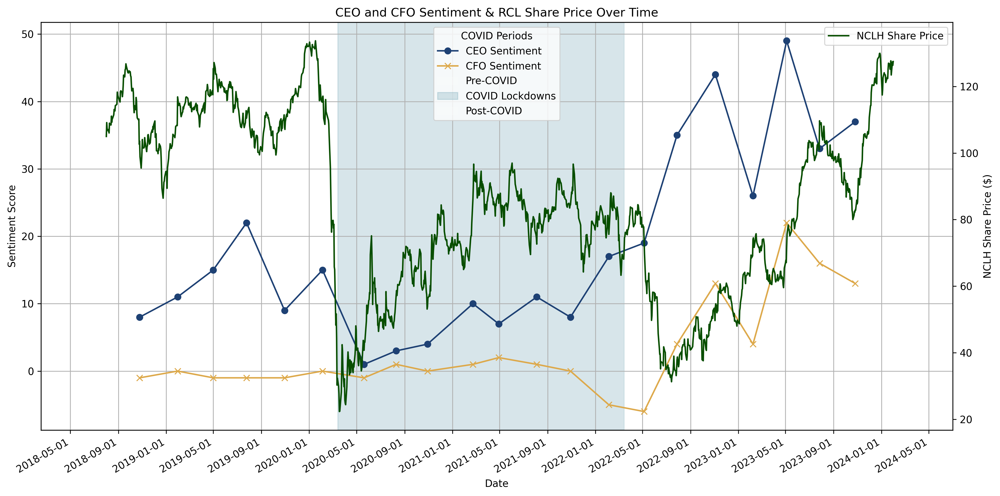

In [3020]:
# Define the ticker symbol for Royal Caribbean Cruises Ltd.
ticker_symbol = 'RCL'

# Get data on this ticker
ticker_data = yf.Ticker(ticker_symbol)

# Define the start and end dates for the time period you're interested in.
start_date = '2018-08-01'
end_date = '2024-02-01'

# Get the historical prices for this ticker within the specified time frame
ticker_df = ticker_data.history(start=start_date, end=end_date)

# Reset the index to make 'Date' a column
ticker_df.reset_index(inplace=True)

# Convert the 'Date' column in df_lm_rcl to datetime with timezone information
df_lm_rcl['Date'] = pd.to_datetime(df_lm_rcl['Date']).dt.tz_localize(None)

# Convert the 'Date' column in ticker_df to datetime with timezone information
ticker_df['Date'] = pd.to_datetime(ticker_df['Date']).dt.tz_localize(None)

# Merge the dataframes on the 'Date' column
combined_df = pd.merge(df_lm_rcl, ticker_df, on='Date', how='inner')

# Plotting
fig, ax1 = plt.subplots(figsize=(14, 7), dpi=300)

# Plot sentiment scores on the primary y-axis
ax1.plot(combined_df['Date'], combined_df['CEO Sentiment Score'], label='CEO Sentiment', linestyle='-', marker='o', color = ceo)
ax1.plot(combined_df['Date'], combined_df['CFO Sentiment Score'], label='CFO Sentiment', linestyle='-', marker='x', color = cfo)
ax1.set_xlabel('Date')
ax1.set_ylabel('Sentiment Score')
ax1.legend(loc='lower right')

# Share Price on the secondary y-axis
ax2 = ax1.twinx()
ax2.plot(ticker_df['Date'], ticker_df['Close'], label='NCLH Share Price', linestyle='-', color=prices)
ax2.set_ylabel('NCLH Share Price ($)')
ax2.legend(loc='upper right')

# Formatting dates on the x-axis
ax1.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
ax1.xaxis.set_major_locator(mdates.MonthLocator(interval=4))  # Set interval to 4 months

# Rotate the tick labels diagonally
plt.gcf().autofmt_xdate()  # Auto-rotates the dates to show them more clearly

# Title and grid
ax1.set_title('CEO and CFO Sentiment & RCL Share Price Over Time')
ax1.grid(True)

# Adding COVID background colors
colors = ['white', bse, 'white']  # Colors for Pre-COVID, COVID Lockdowns, and Post-COVID
for i, row in covid_periods_df.iterrows():
    ax1.axvspan(row['Start Date'], row['End Date'], color=colors[i], alpha=0.2, label=row['Period'])

# Show the plot
plt.tight_layout()

# Adding legend for COVID periods
handles, labels = ax1.get_legend_handles_labels()
ax1.legend(handles=handles, labels=labels, loc='lower right')
ax1.legend(title='COVID Periods')

plt.show()


NCLH

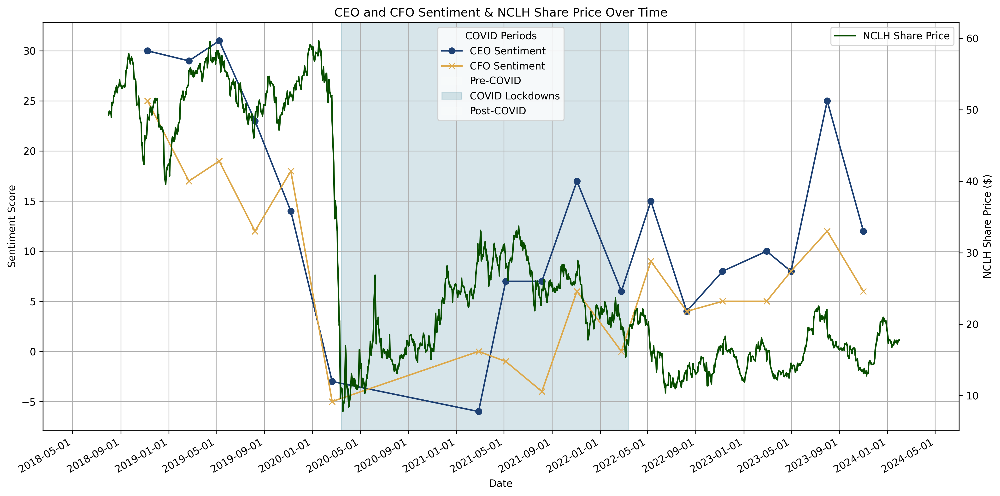

In [3021]:
# Define the ticker symbol for Royal Caribbean Cruises Ltd.
ticker_symbol = 'NCLH'

# Get data on this ticker
ticker_data = yf.Ticker(ticker_symbol)

# Define the start and end dates for the time period you're interested in.
start_date = '2018-08-01'
end_date = '2024-02-01'

# Get the historical prices for this ticker within the specified time frame
ticker_df = ticker_data.history(start=start_date, end=end_date)

# Reset the index to make 'Date' a column
ticker_df.reset_index(inplace=True)

# Convert the 'Date' column in df_lm_rcl to datetime with timezone information
df_lm_nclh['Date'] = pd.to_datetime(df_lm_nclh['Date']).dt.tz_localize(None)

# Convert the 'Date' column in ticker_df to datetime with timezone information
ticker_df['Date'] = pd.to_datetime(ticker_df['Date']).dt.tz_localize(None)

# Merge the dataframes on the 'Date' column
combined_df = pd.merge(df_lm_nclh, ticker_df, on='Date', how='inner')


# Plotting
fig, ax1 = plt.subplots(figsize=(14, 7), dpi=300)

# Plot sentiment scores on the primary y-axis
ax1.plot(combined_df['Date'], combined_df['CEO Sentiment Score'], label='CEO Sentiment', linestyle='-', marker='o', color = ceo)
ax1.plot(combined_df['Date'], combined_df['CFO Sentiment Score'], label='CFO Sentiment', linestyle='-', marker='x', color = cfo)
ax1.set_xlabel('Date')
ax1.set_ylabel('Sentiment Score')
ax1.legend(loc='upper left')

# Share Price on the secondary y-axis
ax2 = ax1.twinx()
ax2.plot(ticker_df['Date'], ticker_df['Close'], label='NCLH Share Price', linestyle='-', color=prices)
ax2.set_ylabel('NCLH Share Price ($)')
ax2.legend(loc='upper right')

# Formatting dates on the x-axis
ax1.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
ax1.xaxis.set_major_locator(mdates.MonthLocator(interval=4))  # Set interval to 4 months

# Rotate the tick labels diagonally
plt.gcf().autofmt_xdate()  # Auto-rotates the dates to show them more clearly

# Title and grid
ax1.set_title('CEO and CFO Sentiment & NCLH Share Price Over Time')
ax1.grid(True)

# Adding COVID background colors
colors = ['white', bse, 'white']  # Colors for Pre-COVID, COVID Lockdowns, and Post-COVID
for i, row in covid_periods_df.iterrows():
    ax1.axvspan(row['Start Date'], row['End Date'], color=colors[i], alpha=0.2, label=row['Period'])

# Show the plot
plt.tight_layout()

# Adding legend for COVID periods
handles, labels = ax1.get_legend_handles_labels()
ax1.legend(handles=handles, labels=labels, loc='upper left')
ax1.legend(title='COVID Periods')

plt.show()


DAL

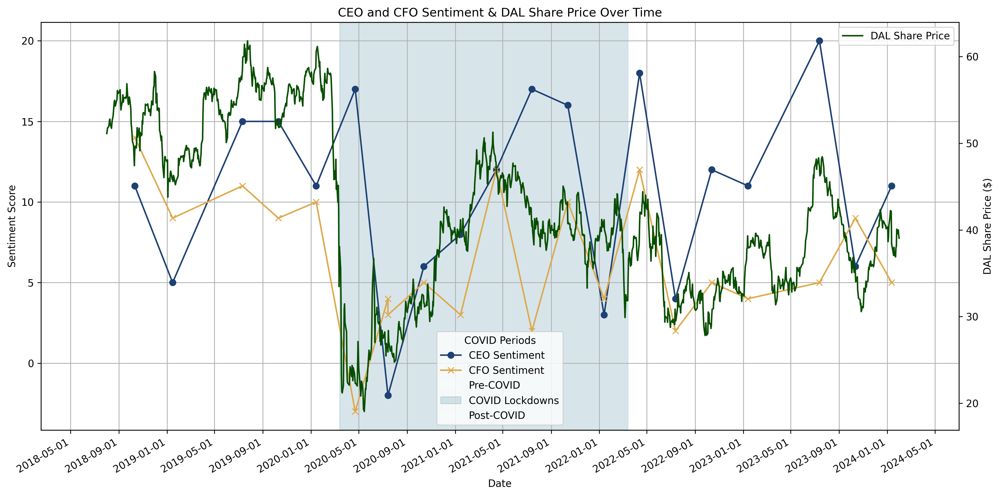

In [3022]:
# Define the ticker symbol for Royal Caribbean Cruises Ltd.
ticker_symbol = 'DAL'

# Get data on this ticker
ticker_data = yf.Ticker(ticker_symbol)

# Define the start and end dates for the time period you're interested in.
start_date = '2018-08-01'
end_date = '2024-02-01'

# Get the historical prices for this ticker within the specified time frame
ticker_df = ticker_data.history(start=start_date, end=end_date)

# Reset the index to make 'Date' a column
ticker_df.reset_index(inplace=True)

# Convert the 'Date' column in df_lm_rcl to datetime with timezone information
df_lm_dal['Date'] = pd.to_datetime(df_lm_dal['Date']).dt.tz_localize(None)

# Convert the 'Date' column in ticker_df to datetime with timezone information
ticker_df['Date'] = pd.to_datetime(ticker_df['Date']).dt.tz_localize(None)

# Merge the dataframes on the 'Date' column
combined_df = pd.merge(df_lm_dal, ticker_df, on='Date', how='inner')


# Plotting
fig, ax1 = plt.subplots(figsize=(14, 7), dpi=300)

# Plot sentiment scores on the primary y-axis
ax1.plot(combined_df['Date'], combined_df['CEO Sentiment Score'], label='CEO Sentiment', linestyle='-', marker='o', color = ceo)
ax1.plot(combined_df['Date'], combined_df['CFO Sentiment Score'], label='CFO Sentiment', linestyle='-', marker='x', color = cfo)
ax1.set_xlabel('Date')
ax1.set_ylabel('Sentiment Score')
ax1.legend(loc='upper left')

# Share Price on the secondary y-axis
ax2 = ax1.twinx()
ax2.plot(ticker_df['Date'], ticker_df['Close'], label='DAL Share Price', linestyle='-', color=prices)
ax2.set_ylabel('DAL Share Price ($)')
ax2.legend(loc='upper right')

# Formatting dates on the x-axis
ax1.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
ax1.xaxis.set_major_locator(mdates.MonthLocator(interval=4))  # Set interval to 4 months

# Rotate the tick labels diagonally
plt.gcf().autofmt_xdate()  # Auto-rotates the dates to show them more clearly

# Title and grid
ax1.set_title('CEO and CFO Sentiment & DAL Share Price Over Time')
ax1.grid(True)

# Adding COVID background colors
colors = ['white', bse, 'white']  # Colors for Pre-COVID, COVID Lockdowns, and Post-COVID
for i, row in covid_periods_df.iterrows():
    ax1.axvspan(row['Start Date'], row['End Date'], color=colors[i], alpha=0.2, label=row['Period'])

# Show the plot
plt.tight_layout()

# Adding legend for COVID periods
handles, labels = ax1.get_legend_handles_labels()
ax1.legend(handles=handles, labels=labels, loc='upper left')
ax1.legend(title='COVID Periods')

plt.show()


LUV

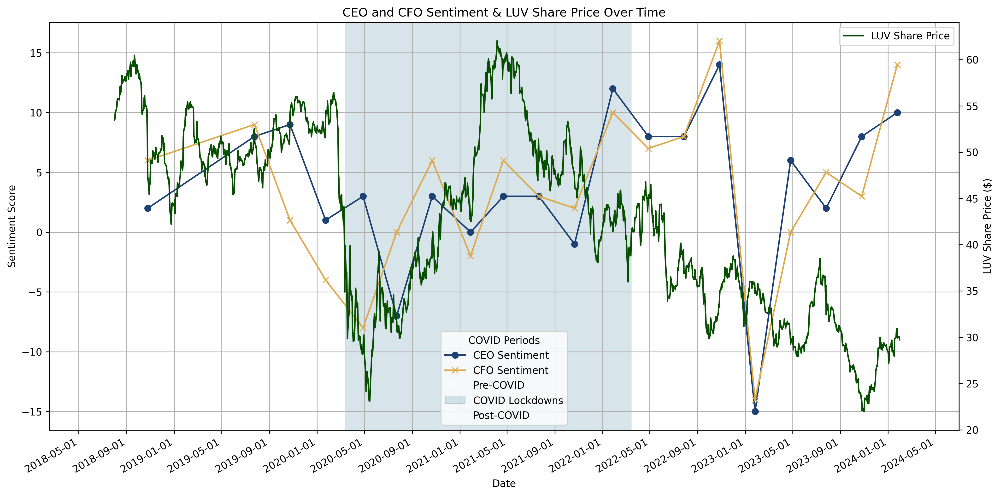

In [3023]:
# Define the ticker symbol for Royal Caribbean Cruises Ltd.
ticker_symbol = 'LUV'

# Get data on this ticker
ticker_data = yf.Ticker(ticker_symbol)

# Define the start and end dates for the time period you're interested in.
start_date = '2018-08-01'
end_date = '2024-02-01'

# Get the historical prices for this ticker within the specified time frame
ticker_df = ticker_data.history(start=start_date, end=end_date)

# Reset the index to make 'Date' a column
ticker_df.reset_index(inplace=True)

# Convert the 'Date' column in df_lm_rcl to datetime with timezone information
df_lm_luv['Date'] = pd.to_datetime(df_lm_luv['Date']).dt.tz_localize(None)

# Convert the 'Date' column in ticker_df to datetime with timezone information
ticker_df['Date'] = pd.to_datetime(ticker_df['Date']).dt.tz_localize(None)

# Merge the dataframes on the 'Date' column
combined_df = pd.merge(df_lm_luv, ticker_df, on='Date', how='inner')


# Plotting
fig, ax1 = plt.subplots(figsize=(14, 7), dpi=300)

# Plot sentiment scores on the primary y-axis
ax1.plot(combined_df['Date'], combined_df['CEO Sentiment Score'], label='CEO Sentiment', linestyle='-', marker='o', color = ceo)
ax1.plot(combined_df['Date'], combined_df['CFO Sentiment Score'], label='CFO Sentiment', linestyle='-', marker='x', color = cfo)
ax1.set_xlabel('Date')
ax1.set_ylabel('Sentiment Score')
ax1.legend(loc='lower left')

# Share Price on the secondary y-axislU
ax2 = ax1.twinx()
ax2.plot(ticker_df['Date'], ticker_df['Close'], label='LUV Share Price', linestyle='-', color=prices)
ax2.set_ylabel('LUV Share Price ($)')
ax2.legend(loc='upper right')

# Formatting dates on the x-axis
ax1.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
ax1.xaxis.set_major_locator(mdates.MonthLocator(interval=4))  # Set interval to 4 months

# Rotate the tick labels diagonally
plt.gcf().autofmt_xdate()  # Auto-rotates the dates to show them more clearly

# Title and grid
ax1.set_title('CEO and CFO Sentiment & LUV Share Price Over Time')
ax1.grid(True)

# Adding COVID background colors
colors = ['white', bse, 'white']  # Colors for Pre-COVID, COVID Lockdowns, and Post-COVID
for i, row in covid_periods_df.iterrows():
    ax1.axvspan(row['Start Date'], row['End Date'], color=colors[i], alpha=0.2, label=row['Period'])

# Show the plot
plt.tight_layout()

# Adding legend for COVID periods
handles, labels = ax1.get_legend_handles_labels()
ax1.legend(handles=handles, labels=labels, loc='upper left')
ax1.legend(title='COVID Periods')

plt.show()


<a id='section4e'></a>
### Final Visualisations with Volume Traded

RCL

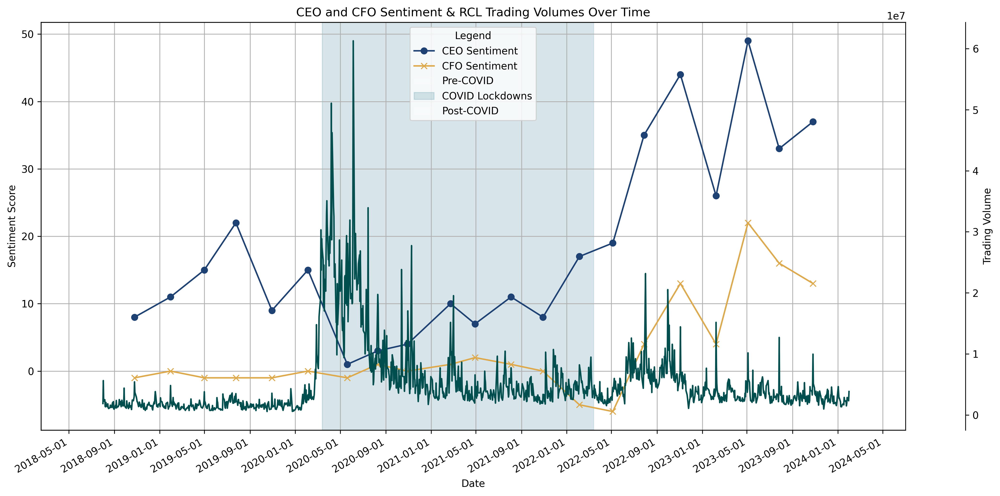

In [3024]:
# Define the ticker symbol for Royal Caribbean Cruises Ltd.
ticker_symbol = 'RCL'
#ticker_symbol = 'NCLH'

# Get data on this ticker
ticker_data = yf.Ticker(ticker_symbol)

# Define the start and end dates for the time period you're interested in.
start_date = '2018-08-01'
end_date = '2024-02-01'

# Get the historical prices for this ticker within the specified time frame
ticker_df = ticker_data.history(start=start_date, end=end_date)

# Reset the index to make 'Date' a column
ticker_df.reset_index(inplace=True)

# Convert the 'Date' column in df_lm_rcl to datetime with timezone information
df_lm_rcl['Date'] = pd.to_datetime(df_lm_rcl['Date']).dt.tz_localize(None)

# Convert the 'Date' column in ticker_df to datetime with timezone information
ticker_df['Date'] = pd.to_datetime(ticker_df['Date']).dt.tz_localize(None)

# Merge the dataframes on the 'Date' column
combined_df = pd.merge(df_lm_rcl, ticker_df, on='Date', how='inner')

# Plotting
fig, ax1 = plt.subplots(figsize=(14, 7), dpi=300)

# Plot sentiment scores on the primary y-axis
ax1.plot(combined_df['Date'], combined_df['CEO Sentiment Score'], label='CEO Sentiment', linestyle='-', marker='o', color = ceo)
ax1.plot(combined_df['Date'], combined_df['CFO Sentiment Score'], label='CFO Sentiment', linestyle='-', marker='x', color = cfo)
ax1.set_xlabel('Date')
ax1.set_ylabel('Sentiment Score')
ax1.legend(loc='upper left')

# Trading volumes on the secondary y-axis
ax2 = ax1.twinx()
ax2.plot(ticker_df['Date'], ticker_df['Volume'], label='RCL Trading Volume', linestyle='solid', color= volumes)
ax2.set_ylabel('Trading Volume')
ax2.spines['right'].set_position(('outward', 60))  # Adjust position of this axis

# Formatting dates on the x-axis
ax1.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
ax1.xaxis.set_major_locator(mdates.MonthLocator(interval=4))  # Set interval to 4 months

# Rotate the tick labels diagonally
plt.gcf().autofmt_xdate()  # Auto-rotates the dates to show them more clearly

# Title and grid
ax1.set_title('CEO and CFO Sentiment & RCL Trading Volumes Over Time')
ax1.grid(True)

# Adding COVID background colors
colors = ['white', bse, 'white']  # Colors for Pre-COVID, COVID Lockdowns, and Post-COVID
for i, row in covid_periods_df.iterrows():
    ax1.axvspan(row['Start Date'], row['End Date'], color=colors[i], alpha=0.2, label=row['Period'])

# Show the plot
plt.tight_layout()

# Adding legend for COVID periods
handles1, labels1 = ax1.get_legend_handles_labels()
handles2, labels2 = ax2.get_legend_handles_labels()
ax1.legend(handles=handles1 + handles2, labels=labels1 + labels2, loc='lower right')
ax1.legend(title='Legend')

plt.show()


NCLH

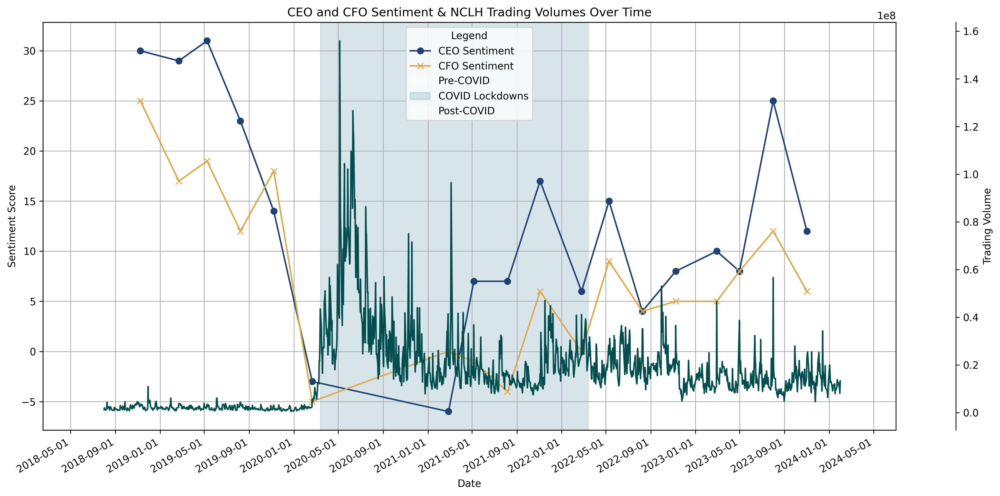

In [3025]:
ticker_symbol = 'NCLH'

# Get data on this ticker
ticker_data = yf.Ticker(ticker_symbol)

# Define the start and end dates for the time period you're interested in.
start_date = '2018-08-01'
end_date = '2024-02-01'

# Get the historical prices for this ticker within the specified time frame
ticker_df = ticker_data.history(start=start_date, end=end_date)

# Reset the index to make 'Date' a column
ticker_df.reset_index(inplace=True)

# Convert the 'Date' column in df_lm_rcl to datetime with timezone information
df_lm_nclh['Date'] = pd.to_datetime(df_lm_nclh['Date']).dt.tz_localize(None)

# Convert the 'Date' column in ticker_df to datetime with timezone information
ticker_df['Date'] = pd.to_datetime(ticker_df['Date']).dt.tz_localize(None)

# Merge the dataframes on the 'Date' column
combined_df = pd.merge(df_lm_nclh, ticker_df, on='Date', how='inner')

# Plotting
fig, ax1 = plt.subplots(figsize=(14, 7), dpi=300)

# Plot sentiment scores on the primary y-axis
ax1.plot(combined_df['Date'], combined_df['CEO Sentiment Score'], label='CEO Sentiment', linestyle='-', marker='o', color = ceo)
ax1.plot(combined_df['Date'], combined_df['CFO Sentiment Score'], label='CFO Sentiment', linestyle='-', marker='x', color = cfo)
ax1.set_xlabel('Date')
ax1.set_ylabel('Sentiment Score')
ax1.legend(loc='upper left')

# Trading volumes on the secondary y-axis
ax2 = ax1.twinx()
ax2.plot(ticker_df['Date'], ticker_df['Volume'], label='RCL Trading Volume', linestyle='solid', color= volumes)
ax2.set_ylabel('Trading Volume')
ax2.spines['right'].set_position(('outward', 60))  # Adjust position of this axis

# Formatting dates on the x-axis
ax1.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
ax1.xaxis.set_major_locator(mdates.MonthLocator(interval=4))  # Set interval to 4 months

# Rotate the tick labels diagonally
plt.gcf().autofmt_xdate()  # Auto-rotates the dates to show them more clearly

# Title and grid
ax1.set_title('CEO and CFO Sentiment & NCLH Trading Volumes Over Time')
ax1.grid(True)

# Adding COVID background colors
colors = ['white', bse, 'white']  # Colors for Pre-COVID, COVID Lockdowns, and Post-COVID
for i, row in covid_periods_df.iterrows():
    ax1.axvspan(row['Start Date'], row['End Date'], color=colors[i], alpha=0.2, label=row['Period'])

# Show the plot
plt.tight_layout()

# Adding legend for COVID periods
handles1, labels1 = ax1.get_legend_handles_labels()
handles2, labels2 = ax2.get_legend_handles_labels()
ax1.legend(handles=handles1 + handles2, labels=labels1 + labels2, loc='upper left')
ax1.legend(title='Legend')

plt.show()


DAL

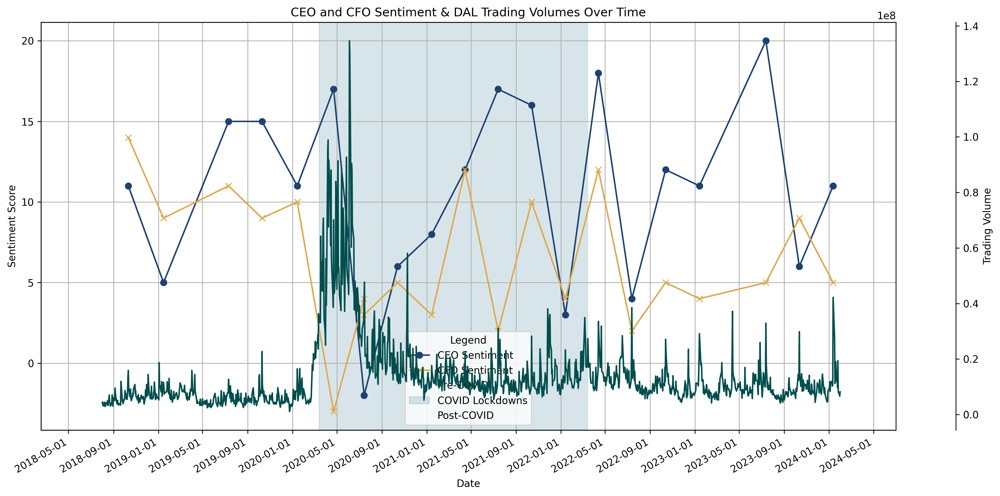

In [3026]:
ticker_symbol = 'DAL'

# Get data on this ticker
ticker_data = yf.Ticker(ticker_symbol)

# Define the start and end dates for the time period you're interested in.
start_date = '2018-08-01'
end_date = '2024-02-01'

# Get the historical prices for this ticker within the specified time frame
ticker_df = ticker_data.history(start=start_date, end=end_date)

# Reset the index to make 'Date' a column
ticker_df.reset_index(inplace=True)

# Convert the 'Date' column in df_lm_rcl to datetime with timezone information
df_lm_dal['Date'] = pd.to_datetime(df_lm_dal['Date']).dt.tz_localize(None)

# Convert the 'Date' column in ticker_df to datetime with timezone information
ticker_df['Date'] = pd.to_datetime(ticker_df['Date']).dt.tz_localize(None)

# Merge the dataframes on the 'Date' column
combined_df = pd.merge(df_lm_dal, ticker_df, on='Date', how='inner')
# Plotting
fig, ax1 = plt.subplots(figsize=(14, 7), dpi=300)

# Plot sentiment scores on the primary y-axis
ax1.plot(combined_df['Date'], combined_df['CEO Sentiment Score'], label='CEO Sentiment', linestyle='-', marker='o', color = ceo)
ax1.plot(combined_df['Date'], combined_df['CFO Sentiment Score'], label='CFO Sentiment', linestyle='-', marker='x', color = cfo)
ax1.set_xlabel('Date')
ax1.set_ylabel('Sentiment Score')
ax1.legend(loc='upper left')

# Trading volumes on the secondary y-axis
ax2 = ax1.twinx()
ax2.plot(ticker_df['Date'], ticker_df['Volume'], label='DAL Trading Volume', linestyle='solid', color= volumes)
ax2.set_ylabel('Trading Volume')
ax2.spines['right'].set_position(('outward', 60))  # Adjust position of this axis

# Formatting dates on the x-axis
ax1.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
ax1.xaxis.set_major_locator(mdates.MonthLocator(interval=4))  # Set interval to 4 months

# Rotate the tick labels diagonally
plt.gcf().autofmt_xdate()  # Auto-rotates the dates to show them more clearly

# Title and grid
ax1.set_title('CEO and CFO Sentiment & DAL Trading Volumes Over Time')
ax1.grid(True)

# Adding COVID background colors
colors = ['white', bse, 'white']  # Colors for Pre-COVID, COVID Lockdowns, and Post-COVID

for i, row in covid_periods_df.iterrows():
    ax1.axvspan(row['Start Date'], row['End Date'], color=colors[i], alpha=0.2, label=row['Period'])

# Show the plot
plt.tight_layout()

# Adding legend for COVID periods
handles1, labels1 = ax1.get_legend_handles_labels()
handles2, labels2 = ax2.get_legend_handles_labels()
ax1.legend(handles=handles1 + handles2, labels=labels1 + labels2, loc='upper left')
ax1.legend(title='Legend')

plt.show()


LUV

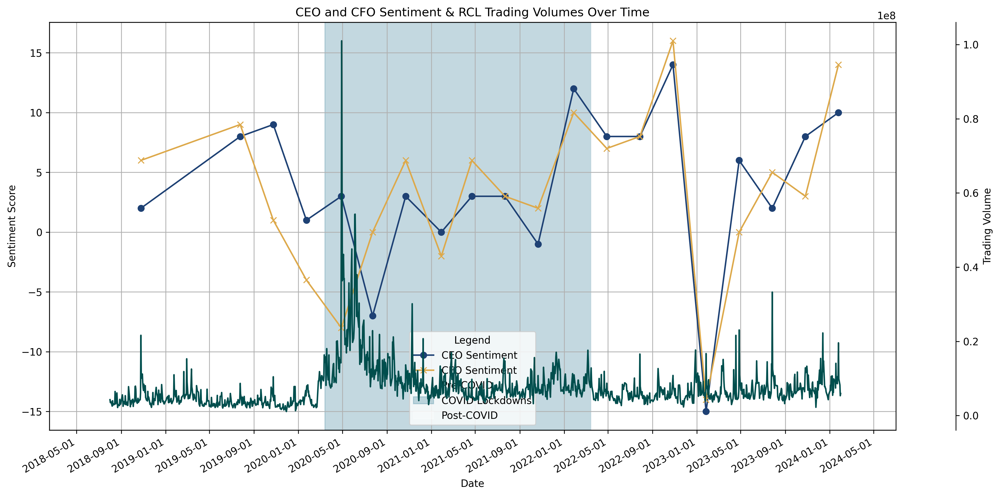

In [3027]:
# Define the ticker symbol for Royal Caribbean Cruises Ltd.
ticker_symbol = 'LUV'

# Get data on this ticker
ticker_data = yf.Ticker(ticker_symbol)

# Define the start and end dates for the time period you're interested in.
start_date = '2018-08-01'
end_date = '2024-02-01'

# Get the historical prices for this ticker within the specified time frame
ticker_df = ticker_data.history(start=start_date, end=end_date)

# Reset the index to make 'Date' a column
ticker_df.reset_index(inplace=True)

# Convert the 'Date' column in df_lm_rcl to datetime with timezone information
df_lm_luv['Date'] = pd.to_datetime(df_lm_luv['Date']).dt.tz_localize(None)

# Convert the 'Date' column in ticker_df to datetime with timezone information
ticker_df['Date'] = pd.to_datetime(ticker_df['Date']).dt.tz_localize(None)

# Merge the dataframes on the 'Date' column
combined_df = pd.merge(df_lm_luv, ticker_df, on='Date', how='inner')
# Plotting
fig, ax1 = plt.subplots(figsize=(14, 7), dpi=300)

# Plot sentiment scores on the primary y-axis
ax1.plot(combined_df['Date'], combined_df['CEO Sentiment Score'], label='CEO Sentiment', linestyle='-', marker='o', color = ceo)
ax1.plot(combined_df['Date'], combined_df['CFO Sentiment Score'], label='CFO Sentiment', linestyle='-', marker='x', color = cfo)
ax1.set_xlabel('Date')
ax1.set_ylabel('Sentiment Score')
ax1.legend(loc='upper left')

# Trading volumes on the secondary y-axis
ax2 = ax1.twinx()
ax2.plot(ticker_df['Date'], ticker_df['Volume'], label='RCL Trading Volume', linestyle='solid', color= volumes)
ax2.set_ylabel('Trading Volume')
ax2.spines['right'].set_position(('outward', 60))  # Adjust position of this axis

# Formatting dates on the x-axis
ax1.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
ax1.xaxis.set_major_locator(mdates.MonthLocator(interval=4))  # Set interval to 4 months

# Rotate the tick labels diagonally
plt.gcf().autofmt_xdate()  # Auto-rotates the dates to show them more clearly

# Title and grid
ax1.set_title('CEO and CFO Sentiment & RCL Trading Volumes Over Time')
ax1.grid(True)

# Adding COVID background colors
colors = ['white', bse, 'white']  # Colors for Pre-COVID, COVID Lockdowns, and Post-COVID
for i, row in covid_periods_df.iterrows():
    ax1.axvspan(row['Start Date'], row['End Date'], color=colors[i], alpha=0.3, label=row['Period'])

# Show the plot
plt.tight_layout()

# Adding legend for COVID periods
handles1, labels1 = ax1.get_legend_handles_labels()
handles2, labels2 = ax2.get_legend_handles_labels()
ax1.legend(handles=handles1 + handles2, labels=labels1 + labels2, loc='upper right')
ax1.legend(title='Legend')

plt.show()


<a id='section5'></a>
## 5) Regression Analysis
---------

<a id='section5a'></a>
### Linear Regression

_____

[Return to Top](#top)

RCL

In [3028]:
df_regression_rcl= df_lm_rcl.copy()

In [3029]:
# Define the ticker symbol for your company, e.g., NCLH for Norwegian Cruise Line Holdings Ltd.
ticker_symbol = 'RCL'

# Get data on this ticker
ticker_data = yf.Ticker(ticker_symbol)

# Fetch historical market data
historical_data = ticker_data.history(period="max")  # Adjust the period as necessary

# Reset the index to make 'Date' a column in the DataFrame
historical_data.reset_index(inplace=True)

# Focus on the 'Date' and 'Close' columns for simplicity
share_prices = historical_data[['Date', 'Close']]
share_prices
# First, ensure 'Date' is in datetime format
share_prices['Date'] = pd.to_datetime(share_prices['Date'])

# Convert datetime to date (removing time and timezone)
share_prices['Date'] = share_prices['Date'].dt.date
share_prices

,Date,Close
0,1993-04-28,5.865181
1,1993-04-29,5.985700
2,1993-04-30,5.905355
3,1993-05-03,5.905355
4,1993-05-04,5.825010
...,...,...
7772,2024-03-11,127.800003
7773,2024-03-12,129.740005
7774,2024-03-13,132.110001
7775,2024-03-14,128.710007


In [3030]:
df_regression_rcl = df_regression_rcl[['Date', 'Title', 'CEO Sentiment Score', 'CFO Sentiment Score']]
df_regression_rcl.head(5)

,Date,Title,CEO Sentiment Score,CFO Sentiment Score
21,2018-10-25,Royal Caribbean Cruises Ltd (RCL) Q3 2018 Earn...,8,-1
20,2019-01-30,Royal Caribbean Cruises Ltd (RCL) Q4 2018 Earn...,11,0
19,2019-05-01,Royal Caribbean Cruises Ltd (RCL) Q1 2019 Earn...,15,-1
18,2019-07-25,Royal Caribbean Cruises Ltd (RCL) Q2 2019 Earn...,22,-1
17,2019-10-30,Royal Caribbean Cruises Ltd (RCL) Q3 2019 Earn...,9,-1


In [3031]:
# Convert 'Date' columns in both DataFrames to datetime objects and ensure they're timezone-naive
df_regression_rcl['Date'] = pd.to_datetime(df_regression_rcl['Date']).dt.tz_localize(None)
share_prices['Date'] = pd.to_datetime(share_prices['Date']).dt.tz_localize(None)

# Ensure both DataFrames are sorted by 'Date'
df_regression_rcl = df_regression_rcl.sort_values(by='Date')
share_prices = share_prices.sort_values(by='Date')

# Perform the asof merge to match each share price with the nearest preceding earnings call
merged_df_regression_rcl = pd.merge_asof(share_prices, df_regression_rcl, on='Date', direction='backward')

# Filter the DataFrame to keep only rows on or after September 1, 2018
filtered_df_regression_rcl = merged_df_regression_rcl[merged_df_regression_rcl['Date'] >= pd.Timestamp('2018-10-25')]

# Display the fi
filtered_df_regression_rcl.head(5)


,Date,Close,Title,CEO Sentiment Score,CFO Sentiment Score
6422,2018-10-25,103.579094,Royal Caribbean Cruises Ltd (RCL) Q3 2018 Earn...,8.0,-1.0
6423,2018-10-26,98.905846,Royal Caribbean Cruises Ltd (RCL) Q3 2018 Earn...,8.0,-1.0
6424,2018-10-29,95.499268,Royal Caribbean Cruises Ltd (RCL) Q3 2018 Earn...,8.0,-1.0
6425,2018-10-30,97.696747,Royal Caribbean Cruises Ltd (RCL) Q3 2018 Earn...,8.0,-1.0
6426,2018-10-31,100.498787,Royal Caribbean Cruises Ltd (RCL) Q3 2018 Earn...,8.0,-1.0


In [3032]:

# regression function of CEO sentiment score and CFO sentiment score on the share price
import statsmodels.api as sm

# Define the independent variables (CEO and CFO sentiment scores)
X = filtered_df_regression_rcl[['CEO Sentiment Score', 'CFO Sentiment Score']]
# Define the dependent variable (share price)
y = filtered_df_regression_rcl['Close']

# Add a constant to the independent variables
X = sm.add_constant(X)

# Fit the OLS model
linear_model = sm.OLS(y, X).fit()
# Print the model summary
print(linear_model.summary())


                            OLS Regression Results                            
Dep. Variable:                  Close   R-squared:                       0.051
Model:                            OLS   Adj. R-squared:                  0.050
Method:                 Least Squares   F-statistic:                     36.39
Date:                Sun, 17 Mar 2024   Prob (F-statistic):           4.05e-16
Time:                        01:39:30   Log-Likelihood:                -6305.3
No. Observations:                1355   AIC:                         1.262e+04
Df Residuals:                    1352   BIC:                         1.263e+04
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
                          coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------
const                  89.7772    

NCLH

In [3033]:
df_regression_nchl= df_lm_nclh.copy()

In [3034]:
# Define the ticker symbol for your company, e.g., NCLH for Norwegian Cruise Line Holdings Ltd.
ticker_symbol = 'NCLH'

# Get data on this ticker
ticker_data = yf.Ticker(ticker_symbol)

# Fetch historical market data
historical_data = ticker_data.history(period="max")  # Adjust the period as necessary

# Reset the index to make 'Date' a column in the DataFrame
historical_data.reset_index(inplace=True)

# Focus on the 'Date' and 'Close' columns for simplicity
share_prices = historical_data[['Date', 'Close']]

share_prices
# First, ensure 'Date' is in datetime format
share_prices['Date'] = pd.to_datetime(share_prices['Date'])

# Convert datetime to date (removing time and timezone)
share_prices['Date'] = share_prices['Date'].dt.date
share_prices

,Date,Close
0,2013-01-18,24.790001
1,2013-01-22,26.950001
2,2013-01-23,27.490000
3,2013-01-24,27.350000
4,2013-01-25,27.350000
...,...,...
2803,2024-03-11,19.799999
2804,2024-03-12,19.559999
2805,2024-03-13,19.870001
2806,2024-03-14,19.330000


In [3035]:
df_regression_nchl = df_regression_nchl[['Date', 'Title', 'CEO Sentiment Score', 'CFO Sentiment Score']]
df_regression_nchl.head(5)

,Date,Title,CEO Sentiment Score,CFO Sentiment Score
18,2018-11-08,Norwegian Cruise Line Holdings Ltd (NCLH) Q3 2...,30,25
17,2019-02-21,Norwegian Cruise Line Holdings Ltd (NCLH) Q4 2...,29,17
16,2019-05-09,Norwegian Cruise Line Holdings (NCLH) Q1 2019 ...,31,19
15,2019-08-08,Norwegian Cruise Line Holdings (NCLH) Q2 2019 ...,23,12
14,2019-11-07,Norwegian Cruise Line Holdings (NCLH) Q3 2019 ...,14,18


In [3036]:
# Convert 'Date' columns in both DataFrames to datetime objects and ensure they're timezone-naive
df_regression_nchl['Date'] = pd.to_datetime(df_regression_nchl['Date']).dt.tz_localize(None)
share_prices['Date'] = pd.to_datetime(share_prices['Date']).dt.tz_localize(None)

# Ensure both DataFrames are sorted by 'Date'
df_regression_nchl = df_regression_nchl.sort_values(by='Date')
share_prices = share_prices.sort_values(by='Date')

# Perform the asof merge to match each share price with the nearest preceding earnings call
merged_df_regression_nchl = pd.merge_asof(share_prices, df_regression_nchl, on='Date', direction='backward')

# Filter the DataFrame to keep only rows on or after September 1, 2018
filtered_df_regression_nchl = merged_df_regression_nchl[merged_df_regression_nchl['Date'] >= pd.Timestamp('2018-11-08')]

# Display the fi
filtered_df_regression_nchl.head(5)

,Date,Close,Title,CEO Sentiment Score,CFO Sentiment Score
1463,2018-11-08,49.270000,Norwegian Cruise Line Holdings Ltd (NCLH) Q3 2...,30.0,25.0
1464,2018-11-09,48.750000,Norwegian Cruise Line Holdings Ltd (NCLH) Q3 2...,30.0,25.0
1465,2018-11-12,48.570000,Norwegian Cruise Line Holdings Ltd (NCLH) Q3 2...,30.0,25.0
1466,2018-11-13,49.490002,Norwegian Cruise Line Holdings Ltd (NCLH) Q3 2...,30.0,25.0
1467,2018-11-14,49.709999,Norwegian Cruise Line Holdings Ltd (NCLH) Q3 2...,30.0,25.0


In [3037]:

# regression function of CEO sentiment score and CFO sentiment score on the share price
import statsmodels.api as sm

# Define the independent variables (CEO and CFO sentiment scores)
X = filtered_df_regression_nchl[['CEO Sentiment Score', 'CFO Sentiment Score']]
# Define the dependent variable (share price)
y = filtered_df_regression_nchl['Close']

# Add a constant to the independent variables
X = sm.add_constant(X)

# Fit the OLS model
linear_model_nchl = sm.OLS(y, X).fit()
# Print the model summary
print(linear_model_nchl.summary())


                            OLS Regression Results                            
Dep. Variable:                  Close   R-squared:                       0.429
Model:                            OLS   Adj. R-squared:                  0.428
Method:                 Least Squares   F-statistic:                     504.6
Date:                Sun, 17 Mar 2024   Prob (F-statistic):          3.76e-164
Time:                        01:39:30   Log-Likelihood:                -5188.0
No. Observations:                1345   AIC:                         1.038e+04
Df Residuals:                    1342   BIC:                         1.040e+04
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
                          coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------
const                  20.4207    

DAL


In [3038]:
df_regression_dal= df_lm_dal.copy()

In [3039]:
# Define the ticker symbol for your company, e.g., NCLH for Norwegian Cruise Line Holdings Ltd.
ticker_symbol = 'DAL'

# Get data on this ticker
ticker_data = yf.Ticker(ticker_symbol)

# Fetch historical market data
historical_data = ticker_data.history(period="max")  # Adjust the period as necessary

# Reset the index to make 'Date' a column in the DataFrame
historical_data.reset_index(inplace=True)

# Focus on the 'Date' and 'Close' columns for simplicity
share_prices = historical_data[['Date', 'Close']]

share_prices
# First, ensure 'Date' is in datetime format
share_prices['Date'] = pd.to_datetime(share_prices['Date'])

# Convert datetime to date (removing time and timezone)
share_prices['Date'] = share_prices['Date'].dt.date
share_prices

,Date,Close
0,2007-05-03,18.271160
1,2007-05-04,18.500431
2,2007-05-07,17.953705
3,2007-05-08,17.309977
4,2007-05-09,17.451077
...,...,...
4242,2024-03-11,42.680000
4243,2024-03-12,42.759998
4244,2024-03-13,43.910000
4245,2024-03-14,43.060001


In [3040]:
df_regression_dal = df_regression_dal[['Date', 'Title', 'CEO Sentiment Score', 'CFO Sentiment Score']]
df_regression_dal.head(5)

,Date,Title,CEO Sentiment Score,CFO Sentiment Score
21,2018-10-11,Delta Air Lines Inc (DAL) Q3 2018 Earnings Con...,11,14
20,2019-01-15,Delta Air Lines Inc (DAL) Q4 2018 Earnings Con...,5,9
18,2019-07-11,Delta Air Lines Inc (DE) (DAL) Q2 2019 Earning...,15,11
17,2019-10-10,Delta Air Lines Inc (DE) (DAL) Q3 2019 Earning...,15,9
16,2020-01-14,Delta Air Lines Inc (DE) (DAL) Q4 2019 Earning...,11,10


In [3041]:
# Convert 'Date' columns in both DataFrames to datetime objects and ensure they're timezone-naive
df_regression_dal['Date'] = pd.to_datetime(df_regression_dal['Date']).dt.tz_localize(None)
share_prices['Date'] = pd.to_datetime(share_prices['Date']).dt.tz_localize(None)

# Ensure both DataFrames are sorted by 'Date'
df_regression_dal = df_regression_dal.sort_values(by='Date')
share_prices = share_prices.sort_values(by='Date')

# Perform the asof merge to match each share price with the nearest preceding earnings call
merged_df_regression_dal = pd.merge_asof(share_prices, df_regression_dal, on='Date', direction='backward')

# Filter the DataFrame to keep only rows on or after September 1, 2018
filtered_df_regression_dal = merged_df_regression_dal[merged_df_regression_dal['Date'] >= pd.Timestamp('2018-10-25')]

# Display the fi
filtered_df_regression_dal.head(5)

,Date,Close,Title,CEO Sentiment Score,CFO Sentiment Score
2892,2018-10-25,51.232887,Delta Air Lines Inc (DAL) Q3 2018 Earnings Con...,11.0,14.0
2893,2018-10-26,50.822716,Delta Air Lines Inc (DAL) Q3 2018 Earnings Con...,11.0,14.0
2894,2018-10-29,50.956261,Delta Air Lines Inc (DAL) Q3 2018 Earnings Con...,11.0,14.0
2895,2018-10-30,52.577858,Delta Air Lines Inc (DAL) Q3 2018 Earnings Con...,11.0,14.0
2896,2018-10-31,52.205841,Delta Air Lines Inc (DAL) Q3 2018 Earnings Con...,11.0,14.0


In [3042]:
# regression function of CEO sentiment score and CFO sentiment score on the share price
import statsmodels.api as sm

# Define the independent variables (CEO and CFO sentiment scores)
X = filtered_df_regression_dal[['CEO Sentiment Score', 'CFO Sentiment Score']]
# Define the dependent variable (share price)
y = filtered_df_regression_dal['Close']

# Add a constant to the independent variables
X = sm.add_constant(X)

# Fit the OLS model
linear_model_dal = sm.OLS(y, X).fit()
# Print the model summary
print(linear_model_dal.summary())


                            OLS Regression Results                            
Dep. Variable:                  Close   R-squared:                       0.329
Model:                            OLS   Adj. R-squared:                  0.328
Method:                 Least Squares   F-statistic:                     332.1
Date:                Sun, 17 Mar 2024   Prob (F-statistic):          4.66e-118
Time:                        01:39:30   Log-Likelihood:                -4684.5
No. Observations:                1355   AIC:                             9375.
Df Residuals:                    1352   BIC:                             9391.
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
                          coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------
const                  31.6362    

LUV


In [3043]:
#1.
df_regression_luv= df_lm_dal.copy()

#2.
# Define the ticker symbol for your company, e.g., NCLH for Norwegian Cruise Line Holdings Ltd.
ticker_symbol = 'LUV'

# Get data on this ticker
ticker_data = yf.Ticker(ticker_symbol)

# Fetch historical market data
historical_data = ticker_data.history(period="max")  # Adjust the period as necessary

# Reset the index to make 'Date' a column in the DataFrame
historical_data.reset_index(inplace=True)

# Focus on the 'Date' and 'Close' columns for simplicity
share_prices = historical_data[['Date', 'Close']]

share_prices
# First, ensure 'Date' is in datetime format
share_prices['Date'] = pd.to_datetime(share_prices['Date'])

# Convert datetime to date (removing time and timezone)
share_prices['Date'] = share_prices['Date'].dt.date
share_prices

#3. 
df_regression_luv = df_regression_luv[['Date', 'Title', 'CEO Sentiment Score', 'CFO Sentiment Score']]
df_regression_luv.head(25)

#4.
# Convert 'Date' columns in both DataFrames to datetime objects and ensure they're timezone-naive
df_regression_luv['Date'] = pd.to_datetime(df_regression_luv['Date']).dt.tz_localize(None)
share_prices['Date'] = pd.to_datetime(share_prices['Date']).dt.tz_localize(None)

# Ensure both DataFrames are sorted by 'Date'
df_regression_luv = df_regression_luv.sort_values(by='Date')
share_prices = share_prices.sort_values(by='Date')

# Perform the asof merge to match each share price with the nearest preceding earnings call
merged_df_regression_luv = pd.merge_asof(share_prices, df_regression_luv, on='Date', direction='backward')

# Filter the DataFrame to keep only rows on or after September 1, 2018
filtered_df_regression_luv = merged_df_regression_luv[merged_df_regression_luv['Date'] >= pd.Timestamp('2018-10-25')]

# Display
filtered_df_regression_luv.head(5)

,Date,Close,Title,CEO Sentiment Score,CFO Sentiment Score
9790,2018-10-25,47.321243,Delta Air Lines Inc (DAL) Q3 2018 Earnings Con...,11.0,14.0
9791,2018-10-26,47.008366,Delta Air Lines Inc (DAL) Q3 2018 Earnings Con...,11.0,14.0
9792,2018-10-29,45.424988,Delta Air Lines Inc (DAL) Q3 2018 Earnings Con...,11.0,14.0
9793,2018-10-30,46.600662,Delta Air Lines Inc (DAL) Q3 2018 Earnings Con...,11.0,14.0
9794,2018-10-31,46.553257,Delta Air Lines Inc (DAL) Q3 2018 Earnings Con...,11.0,14.0


In [3044]:
# regression function of CEO sentiment score and CFO sentiment score on the share price
import statsmodels.api as sm

# Define the independent variables (CEO and CFO sentiment scores)
X = filtered_df_regression_luv[['CEO Sentiment Score', 'CFO Sentiment Score']]
# Define the dependent variable (share price)
y = filtered_df_regression_luv['Close']

# Add a constant to the independent variables
X = sm.add_constant(X)

# Fit the OLS model
linear_model_luv = sm.OLS(y, X).fit()
# Print the model summary
print(linear_model_luv.summary())


                            OLS Regression Results                            
Dep. Variable:                  Close   R-squared:                       0.183
Model:                            OLS   Adj. R-squared:                  0.182
Method:                 Least Squares   F-statistic:                     151.9
Date:                Sun, 17 Mar 2024   Prob (F-statistic):           3.06e-60
Time:                        01:39:30   Log-Likelihood:                -4838.7
No. Observations:                1355   AIC:                             9683.
Df Residuals:                    1352   BIC:                             9699.
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
                          coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------
const                  35.4093    

<a id='section5b'></a>
### Regression Including Lags
------------


### RCL

In [3045]:
import pandas as pd
import statsmodels.api as sm
from statsmodels.regression.mixed_linear_model import MixedLM

# Assuming you've already loaded your dataset into a DataFrame named 'df'
# df = pd.read_csv('path_to_your_dataset.csv')

# Ensure 'Date' or 'Quarter' is in the correct format
# df['Date'] = pd.to_datetime(df['Date'])
# Or for quarterly data: df['Quarter'] = pd.PeriodIndex(df['Quarter'], freq='Q')

# Create lagged variables for both CEO and CFO sentiment scores from the previous quarter
filtered_df_regression_rcl['Lagged_CEO_Sentiment'] = filtered_df_regression_rcl['CEO Sentiment Score'].shift(1)
filtered_df_regression_rcl['Lagged_CFO_Sentiment'] = filtered_df_regression_rcl['CFO Sentiment Score'].shift(1)

# Drop the first row(s) as they now contain NaN values for the lagged variables
filtered_df_regression_rcl.dropna(subset=['Lagged_CEO_Sentiment', 'Lagged_CFO_Sentiment'], inplace=True)

# Define your independent variables (X) and dependent variable (y) with the lagged sentiment scores
X = filtered_df_regression_rcl[['Lagged_CEO_Sentiment', 'Lagged_CFO_Sentiment']]
y = filtered_df_regression_rcl['Close']

# Add a constant to the model
X = sm.add_constant(X)

# Fit the OLS model (assuming a single company's data for simplicity)
model = sm.OLS(y, X).fit()

# Alternatively, for panel data with multiple entities, using Mixed Linear Models
# model = MixedLM(y, X, groups=df['CompanyID']).fit()

# Print the model summary
print(model.summary())

# Now, the regression analysis will show the impact of the previous quarter's CEO and CFO sentiment scores
# on the current quarter's share price, allowing you to assess the predictive power of past sentiments.


                            OLS Regression Results                            
Dep. Variable:                  Close   R-squared:                       0.053
Model:                            OLS   Adj. R-squared:                  0.052
Method:                 Least Squares   F-statistic:                     37.83
Date:                Sun, 17 Mar 2024   Prob (F-statistic):           1.03e-16
Time:                        01:39:30   Log-Likelihood:                -6299.4
No. Observations:                1354   AIC:                         1.260e+04
Df Residuals:                    1351   BIC:                         1.262e+04
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                   89.7960 

NCLH

In [3046]:
import pandas as pd
import statsmodels.api as sm
from statsmodels.regression.mixed_linear_model import MixedLM

# Assuming you've already loaded your dataset into a DataFrame named 'df'
# df = pd.read_csv('path_to_your_dataset.csv')

# Ensure 'Date' or 'Quarter' is in the correct format
# df['Date'] = pd.to_datetime(df['Date'])
# Or for quarterly data: df['Quarter'] = pd.PeriodIndex(df['Quarter'], freq='Q')

# Create lagged variables for both CEO and CFO sentiment scores from the previous quarter
filtered_df_regression_nchl['Lagged_CEO_Sentiment'] = filtered_df_regression_nchl['CEO Sentiment Score'].shift(1)
filtered_df_regression_nchl['Lagged_CFO_Sentiment'] = filtered_df_regression_nchl['CFO Sentiment Score'].shift(1)

# Drop the first row(s) as they now contain NaN values for the lagged variables
filtered_df_regression_nchl.dropna(subset=['Lagged_CEO_Sentiment', 'Lagged_CFO_Sentiment'], inplace=True)

# Define your independent variables (X) and dependent variable (y) with the lagged sentiment scores
X = filtered_df_regression_nchl[['Lagged_CEO_Sentiment', 'Lagged_CFO_Sentiment']]
y = filtered_df_regression_nchl['Close']

# Add a constant to the model
X = sm.add_constant(X)

# Fit the OLS model (assuming a single company's data for simplicity)
model = sm.OLS(y, X).fit()

# Alternatively, for panel data with multiple entities, using Mixed Linear Models
# model = MixedLM(y, X, groups=df['CompanyID']).fit()

# Print the model summary
print(model.summary())

# Now, the regression analysis will show the impact of the previous quarter's CEO and CFO sentiment scores
# on the current quarter's share price, allowing you to assess the predictive power of past sentiments.


                            OLS Regression Results                            
Dep. Variable:                  Close   R-squared:                       0.432
Model:                            OLS   Adj. R-squared:                  0.432
Method:                 Least Squares   F-statistic:                     510.9
Date:                Sun, 17 Mar 2024   Prob (F-statistic):          1.14e-165
Time:                        01:39:30   Log-Likelihood:                -5179.8
No. Observations:                1344   AIC:                         1.037e+04
Df Residuals:                    1341   BIC:                         1.038e+04
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                   20.3834 

DAL

In [3047]:
import pandas as pd
import statsmodels.api as sm
from statsmodels.regression.mixed_linear_model import MixedLM

# Assuming you've already loaded your dataset into a DataFrame named 'df'
# df = pd.read_csv('path_to_your_dataset.csv')

# Ensure 'Date' or 'Quarter' is in the correct format
# df['Date'] = pd.to_datetime(df['Date'])
# Or for quarterly data: df['Quarter'] = pd.PeriodIndex(df['Quarter'], freq='Q')

# Create lagged variables for both CEO and CFO sentiment scores from the previous quarter
filtered_df_regression_dal['Lagged_CEO_Sentiment'] = filtered_df_regression_dal['CEO Sentiment Score'].shift(1)
filtered_df_regression_dal['Lagged_CFO_Sentiment'] = filtered_df_regression_dal['CFO Sentiment Score'].shift(1)

# Drop the first row(s) as they now contain NaN values for the lagged variables
filtered_df_regression_dal.dropna(subset=['Lagged_CEO_Sentiment', 'Lagged_CFO_Sentiment'], inplace=True)

# Define your independent variables (X) and dependent variable (y) with the lagged sentiment scores
X = filtered_df_regression_dal[['Lagged_CEO_Sentiment', 'Lagged_CFO_Sentiment']]
y = filtered_df_regression_dal['Close']

# Add a constant to the model
X = sm.add_constant(X)

# Fit the OLS model (assuming a single company's data for simplicity)
model = sm.OLS(y, X).fit()

# Alternatively, for panel data with multiple entities, using Mixed Linear Models
# model = MixedLM(y, X, groups=df['CompanyID']).fit()

# Print the model summary
print(model.summary())

# Now, the regression analysis will show the impact of the previous quarter's CEO and CFO sentiment scores
# on the current quarter's share price, allowing you to assess the predictive power of past sentiments.


                            OLS Regression Results                            
Dep. Variable:                  Close   R-squared:                       0.322
Model:                            OLS   Adj. R-squared:                  0.321
Method:                 Least Squares   F-statistic:                     320.2
Date:                Sun, 17 Mar 2024   Prob (F-statistic):          1.55e-114
Time:                        01:39:31   Log-Likelihood:                -4688.9
No. Observations:                1354   AIC:                             9384.
Df Residuals:                    1351   BIC:                             9399.
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                   31.8006 

LUV

In [3048]:
import pandas as pd
import statsmodels.api as sm
from statsmodels.regression.mixed_linear_model import MixedLM

# Assuming you've already loaded your dataset into a DataFrame named 'df'
# df = pd.read_csv('path_to_your_dataset.csv')

# Ensure 'Date' or 'Quarter' is in the correct format
# df['Date'] = pd.to_datetime(df['Date'])
# Or for quarterly data: df['Quarter'] = pd.PeriodIndex(df['Quarter'], freq='Q')

# Create lagged variables for both CEO and CFO sentiment scores from the previous quarter
filtered_df_regression_luv['Lagged_CEO_Sentiment'] = filtered_df_regression_luv['CEO Sentiment Score'].shift(1)
filtered_df_regression_luv['Lagged_CFO_Sentiment'] = filtered_df_regression_luv['CFO Sentiment Score'].shift(1)

# Drop the first row(s) as they now contain NaN values for the lagged variables
filtered_df_regression_luv.dropna(subset=['Lagged_CEO_Sentiment', 'Lagged_CFO_Sentiment'], inplace=True)

# Define your independent variables (X) and dependent variable (y) with the lagged sentiment scores
X = filtered_df_regression_rcl[['Lagged_CEO_Sentiment', 'Lagged_CFO_Sentiment']]
y = filtered_df_regression_rcl['Close']

# Add a constant to the model
X = sm.add_constant(X)

# Fit the OLS model (assuming a single company's data for simplicity)
model = sm.OLS(y, X).fit()

# Alternatively, for panel data with multiple entities, using Mixed Linear Models
# model = MixedLM(y, X, groups=df['CompanyID']).fit()

# Print the model summary
print(model.summary())

# Now, the regression analysis will show the impact of the previous quarter's CEO and CFO sentiment scores
# on the current quarter's share price, allowing you to assess the predictive power of past sentiments.


                            OLS Regression Results                            
Dep. Variable:                  Close   R-squared:                       0.053
Model:                            OLS   Adj. R-squared:                  0.052
Method:                 Least Squares   F-statistic:                     37.83
Date:                Sun, 17 Mar 2024   Prob (F-statistic):           1.03e-16
Time:                        01:39:31   Log-Likelihood:                -6299.4
No. Observations:                1354   AIC:                         1.260e+04
Df Residuals:                    1351   BIC:                         1.262e+04
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                   89.7960 